> Published as a conference paper at ICLR 2021
>
> AN IMAGE IS WORTH 16X16 WORDS:  
> TRANSFORMERS FOR IMAGE RECOGNITION AT SCALE
>
> **Alexey Dosovitskiy***∗,†***, Lucas Beyer***∗***, Alexander
> Kolesnikov***∗***, Dirk Weissenborn***∗***,** **Xiaohua Zhai***∗***,
> Thomas Unterthiner, Mostafa Dehghani, Matthias Minderer,** **Georg
> Heigold, Sylvain Gelly, Jakob Uszkoreit, Neil Houlsby***∗,†*

arXiv:2010.11929v2 \[cs.CV\] 3 Jun 2021

> *∗*equal technical contribution, *†*equal advising  
> Google Research, Brain Team  
> *{*adosovitskiy, neilhoulsby*}*@google.com

ABSTRACT

> While the Transformer architecture has become the de-facto standard
> for natural language processing tasks, its applications to computer
> vision remain limited. In vision, attention is either applied in
> conjunction with convolutional networks, or used to replace certain
> components of convolutional networks while keeping their overall
> structure in place. We show that this reliance on CNNs is not
> necessary and a pure transformer applied directly to sequences of
> image patches can perform very well on image classiﬁcation tasks. When
> pre-trained on large amounts of data and transferred to multiple
> mid-sized or small image recognition benchmarks (ImageNet, CIFAR-100,
> VTAB, etc.), Vision Transformer (ViT) attains excellent results
> compared to state-of-the-art convolutional networks while requiring
> substantially fewer computational resources to train.1
>
> 1 INTRODUCTION
>
> Self-attention-based architectures, in particular Transformers
> (Vaswani et al., 2017), have become the model of choice in natural
> language processing (NLP). The dominant approach is to pre-train on a
> large text corpus and then ﬁne-tune on a smaller task-speciﬁc dataset
> (Devlin et al., 2019). Thanks to Transformers’ computational efﬁciency
> and scalability, it has become possible to train models of
> unprecedented size, with over 100B parameters (Brown et al., 2020;
> Lepikhin et al., 2020). With the models and datasets growing, there is
> still no sign of saturating performance.
>
> In computer vision, however, convolutional architectures remain
> dominant (LeCun et al., 1989; Krizhevsky et al., 2012; He et al.,
> 2016). Inspired by NLP successes, multiple works try combining
> CNN-like architectures with self-attention (Wang et al., 2018; Carion
> et al., 2020), some replacing the convolutions entirely (Ramachandran
> et al., 2019; Wang et al., 2020a). The latter models, while
> theoretically efﬁcient, have not yet been scaled effectively on modern
> hardware accelerators due to the use of specialized attention
> patterns. Therefore, in large-scale image recognition, classic
> ResNetlike architectures are still state of the art (Mahajan et al.,
> 2018; Xie et al., 2020; Kolesnikov et al., 2020).
>
> Inspired by the Transformer scaling successes in NLP, we experiment
> with applying a standard Transformer directly to images, with the
> fewest possible modiﬁcations. To do so, we split an image into patches
> and provide the sequence of linear embeddings of these patches as an
> input to a Transformer. Image patches are treated the same way as
> tokens (words) in an NLP application. We train the model on image
> classiﬁcation in supervised fashion.
>
> When trained on mid-sized datasets such as ImageNet without strong
> regularization, these models yield modest accuracies of a few
> percentage points below ResNets of comparable size. This seemingly
> discouraging outcome may be expected: Transformers lack some of the
> inductive biases

<table>
<thead>
<tr class="header">
<th>1Fine-tuning</th>
<th>code</th>
<th>and</th>
<th>pre-trained</th>
<th>models</th>
<th>are</th>
<th>available</th>
<th>at</th>
<th><blockquote>
<p>https://github.com/</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td><blockquote>
<p>google-research/vision_transformer</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

1

> Published as a conference paper at ICLR 2021
>
> inherent to CNNs, such as translation equivariance and locality, and
> therefore do not generalize well when trained on insufﬁcient amounts
> of data.
>
> However, the picture changes if the models are trained on larger
> datasets (14M-300M images). We ﬁnd that large scale training trumps
> inductive bias. Our Vision Transformer (ViT) attains excellent results
> when pre-trained at sufﬁcient scale and transferred to tasks with
> fewer datapoints. When pre-trained on the public ImageNet-21k dataset
> or the in-house JFT-300M dataset, ViT approaches or beats state of the
> art on multiple image recognition benchmarks. In particular, the best
> model reaches the accuracy of 88*.*55% on ImageNet, 90*.*72% on
> ImageNet-ReaL, 94*.*55% on CIFAR-100, and 77*.*63% on the VTAB suite
> of 19 tasks.
>
> 2 RELATED WORK
>
> Transformers were proposed by Vaswani et al. (2017) for machine
> translation, and have since become the state of the art method in many
> NLP tasks. Large Transformer-based models are often pre-trained on
> large corpora and then ﬁne-tuned for the task at hand: BERT (Devlin et
> al., 2019) uses a denoising self-supervised pre-training task, while
> the GPT line of work uses language modeling as its pre-training task
> (Radford et al., 2018; 2019; Brown et al., 2020).
>
> Naive application of self-attention to images would require that each
> pixel attends to every other pixel. With quadratic cost in the number
> of pixels, this does not scale to realistic input sizes. Thus, to
> apply Transformers in the context of image processing, several
> approximations have been tried in the past. Parmar et al. (2018)
> applied the self-attention only in local neighborhoods for each query
> pixel instead of globally. Such local multi-head dot-product self
> attention blocks can completely replace convolutions (Hu et al., 2019;
> Ramachandran et al., 2019; Zhao et al., 2020). In a different line of
> work, Sparse Transformers (Child et al., 2019) employ scalable
> approximations to global selfattention in order to be applicable to
> images. An alternative way to scale attention is to apply it in blocks
> of varying sizes (Weissenborn et al., 2019), in the extreme case only
> along individual axes (Ho et al., 2019; Wang et al., 2020a). Many of
> these specialized attention architectures demonstrate promising
> results on computer vision tasks, but require complex engineering to
> be implemented efﬁciently on hardware accelerators.
>
> Most related to ours is the model of Cordonnier et al. (2020), which
> extracts patches of size 2 *×* 2 from the input image and applies full
> self-attention on top. This model is very similar to ViT, but our work
> goes further to demonstrate that large scale pre-training makes
> vanilla transformers competitive with (or even better than)
> state-of-the-art CNNs. Moreover, Cordonnier et al. (2020) use a small
> patch size of 2 *×* 2 pixels, which makes the model applicable only to
> small-resolution images, while we handle medium-resolution images as
> well.
>
> There has also been a lot of interest in combining convolutional
> neural networks (CNNs) with forms of self-attention, e.g. by
> augmenting feature maps for image classiﬁcation (Bello et al., 2019)
> or by further processing the output of a CNN using self-attention,
> e.g. for object detection (Hu et al., 2018; Carion et al., 2020),
> video processing (Wang et al., 2018; Sun et al., 2019), image
> classiﬁcation (Wu et al., 2020), unsupervised object discovery
> (Locatello et al., 2020), or uniﬁed text-vision tasks (Chen et al.,
> 2020c; Lu et al., 2019; Li et al., 2019).
>
> Another recent related model is image GPT (iGPT) (Chen et al., 2020a),
> which applies Transformers to image pixels after reducing image
> resolution and color space. The model is trained in an unsupervised
> fashion as a generative model, and the resulting representation can
> then be ﬁne-tuned or probed linearly for classiﬁcation performance,
> achieving a maximal accuracy of 72% on ImageNet.
>
> Our work adds to the increasing collection of papers that explore
> image recognition at larger scales than the standard ImageNet dataset.
> The use of additional data sources allows to achieve state-ofthe-art
> results on standard benchmarks (Mahajan et al., 2018; Touvron et al.,
> 2019; Xie et al., 2020). Moreover, Sun et al. (2017) study how CNN
> performance scales with dataset size, and Kolesnikov et al. (2020);
> Djolonga et al. (2020) perform an empirical exploration of CNN
> transfer learning from large scale datasets such as ImageNet-21k and
> JFT-300M. We focus on these two latter datasets as well, but train
> Transformers instead of ResNet-based models used in prior works.

2

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th><blockquote>
<p><em>Class</em><br />
Bird<br />
Ball<br />
Car<br />
...</p>
</blockquote></th>
<th><blockquote>
<p><em>Vision Transformer (ViT)</em></p>
</blockquote></th>
<th><em>Transformer Encoder</em></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td><blockquote>
<p>MLP<br />
Head</p>
</blockquote></td>
<td>L x</td>
<td><blockquote>
<p>+</p>
</blockquote></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td>MLP</td>
<td></td>
</tr>
</tbody>
</table>

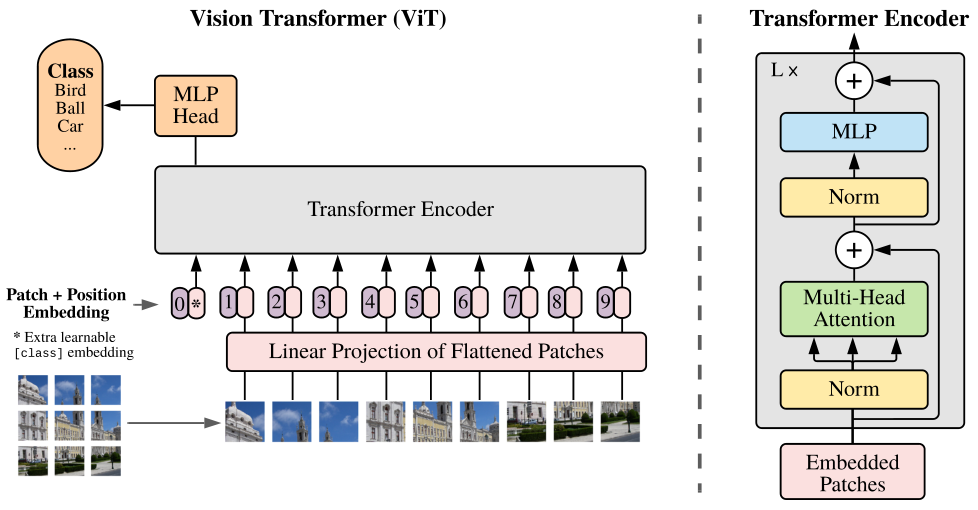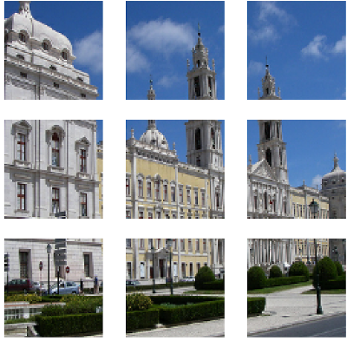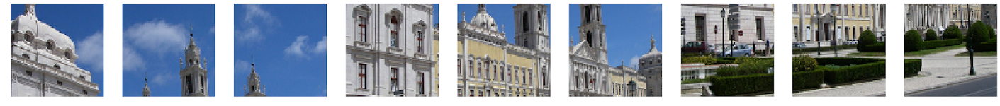

> Transformer Encoder Norm

\+

<table>
<thead>
<tr class="header">
<th><blockquote>
<p><em>Patch + Position</em><br />
<em>Embedding</em></p>
</blockquote></th>
<th>1</th>
<th>2</th>
<th>3</th>
<th>4</th>
<th>5</th>
<th>6</th>
<th>7</th>
<th>8</th>
<th><blockquote>
<p>9</p>
</blockquote></th>
<th><blockquote>
<p>Multi-Head<br />
Attention</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td><blockquote>
<p><em>*</em> Extra learnable<br />
[ cl ass] embedding</p>
</blockquote></td>
<td></td>
<td><blockquote>
<p>Linear Projection of Flattened Patches</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

Norm

> Embedded  
> Patches
>
> Figure 1: Model overview. We split an image into ﬁxed-size patches,
> linearly embed each of them, add position embeddings, and feed the
> resulting sequence of vectors to a standard Transformer encoder. In
> order to perform classiﬁcation, we use the standard approach of adding
> an extra learnable“classiﬁcation token” to the sequence. The
> illustration of the Transformer encoder was inspired by Vaswani et al.
> (2017).
>
> 3 METHOD
>
> In model design we follow the original Transformer (Vaswani et al.,
> 2017) as closely as possible. An advantage of this intentionally
> simple setup is that scalable NLP Transformer architectures – and
> their efﬁcient implementations – can be used almost out of the box.
>
> 3.1 VISION TRANSFORMER (VIT)
>
> An overview of the model is depicted in Figure 1. The standard
> Transformer receives as input a 1D sequence of token embeddings. To
> handle 2D images, we reshape the image **x** *∈* R*H×W ×C*into a
> sequence of ﬂattened 2D patches **x***p ∈* R*N×*(*P* 2*·C*), where
> (*H, W*) is the resolution of the original image, *C* is the number of
> channels, (*P, P*) is the resolution of each image patch, and *N* =
> *HW/P*2 is the resulting number of patches, which also serves as the
> effective input sequence length for the Transformer. The Transformer
> uses constant latent vector size *D* through all of its layers, so we
> ﬂatten the patches and map to *D* dimensions with a trainable linear
> projection (Eq. 1). We refer to the output of this projection as the
> patch embeddings.
>
> Similar to BERT’s \[class\] token, we prepend a learnable embedding to
> the sequence of embedded patches (**z**0 0= **x**class), whose state
> at the output of the Transformer encoder (**z**0 *L*) serves as the
> image representation **y** (Eq. 4). Both during pre-training and
> ﬁne-tuning, a classiﬁcation head is attached to **z**0 *L*. The
> classiﬁcation head is implemented by a MLP with one hidden layer at
> pre-training time and by a single linear layer at ﬁne-tuning time.
>
> Position embeddings are added to the patch embeddings to retain
> positional information. We use standard learnable 1D position
> embeddings, since we have not observed signiﬁcant performance gains
> from using more advanced 2D-aware position embeddings (Appendix D.4).
> The resulting sequence of embedding vectors serves as input to the
> encoder.
>
> The Transformer encoder (Vaswani et al., 2017) consists of alternating
> layers of multiheaded selfattention (MSA, see Appendix A) and MLP
> blocks (Eq. 2, 3). Layernorm (LN) is applied before every block, and
> residual connections after every block (Wang et al., 2019; Baevski &
> Auli, 2019).

3

> Published as a conference paper at ICLR 2021
>
> The MLP contains two layers with a GELU non-linearity.
>
> **z**0 = \[**x**class; **x**1 *p***E**; **x**2 *p***E**; *· · ·* ;
> **x***N p***E**\] + **E***pos,* **E** *∈* R(*P* 2*·C*)*×D,* **E***pos
> ∈* R(*N*+1)*×D* (1)**z***′ℓ*= MSA(LN(**z***ℓ−*1)) + **z***ℓ−*1*,*  
> *ℓ* = 1 *. . . L* (2)**z***ℓ* = MLP(LN(**z***′ℓ*)) + **z***′ℓ,* *ℓ* =
> 1 *. . . L* (3)
>
> **y** = LN(**z**0 *L*) (4)
>
> **Inductive bias.** We note that Vision Transformer has much less
> image-speciﬁc inductive bias than CNNs. In CNNs, locality,
> two-dimensional neighborhood structure, and translation equivariance
> are baked into each layer throughout the whole model. In ViT, only MLP
> layers are local and translationally equivariant, while the
> self-attention layers are global. The two-dimensional neighborhood
> structure is used very sparingly: in the beginning of the model by
> cutting the image into patches and at ﬁne-tuning time for adjusting
> the position embeddings for images of different resolution (as
> described below). Other than that, the position embeddings at
> initialization time carry no information about the 2D positions of the
> patches and all spatial relations between the patches have to be
> learned from scratch.
>
> **Hybrid Architecture.** As an alternative to raw image patches, the
> input sequence can be formed from feature maps of a CNN (LeCun et al.,
> 1989). In this hybrid model, the patch embedding projection **E** (Eq.
> 1) is applied to patches extracted from a CNN feature map. As a
> special case, the patches can have spatial size 1x1, which means that
> the input sequence is obtained by simply ﬂattening the spatial
> dimensions of the feature map and projecting to the Transformer
> dimension.
>
> The classiﬁcation input embedding and position embeddings are added as
> described above.
>
> 3.2 FINE-TUNING AND HIGHER RESOLUTION
>
> Typically, we pre-train ViT on large datasets, and ﬁne-tune to
> (smaller) downstream tasks. For this, we remove the pre-trained
> prediction head and attach a zero-initialized *D × K* feedforward
> layer, where *K* is the number of downstream classes. It is often
> beneﬁcial to ﬁne-tune at higher resolution than pre-training (Touvron
> et al., 2019; Kolesnikov et al., 2020). When feeding images of higher
> resolution, we keep the patch size the same, which results in a larger
> effective sequence length. The Vision Transformer can handle arbitrary
> sequence lengths (up to memory constraints), however, the pre-trained
> position embeddings may no longer be meaningful. We therefore perform
> 2D interpolation of the pre-trained position embeddings, according to
> their location in the original image. Note that this resolution
> adjustment and patch extraction are the only points at which an
> inductive bias about the 2D structure of the images is manually
> injected into the Vision Transformer.
>
> 4 EXPERIMENTS
>
> We evaluate the representation learning capabilities of ResNet, Vision
> Transformer (ViT), and the hybrid. To understand the data requirements
> of each model, we pre-train on datasets of varying size and evaluate
> many benchmark tasks. When considering the computational cost of
> pre-training the model, ViT performs very favourably, attaining state
> of the art on most recognition benchmarks at a lower pre-training
> cost. Lastly, we perform a small experiment using self-supervision,
> and show that self-supervised ViT holds promise for the future.
>
> 4.1 SETUP
>
> **Datasets.** To explore model scalability, we use the ILSVRC-2012
> ImageNet dataset with 1k classes and 1.3M images (we refer to it as
> ImageNet in what follows), its superset ImageNet-21k with 21k classes
> and 14M images (Deng et al., 2009), and JFT (Sun et al., 2017) with
> 18k classes and 303M high-resolution images. We de-duplicate the
> pre-training datasets w.r.t. the test sets of the downstream tasks
> following Kolesnikov et al. (2020). We transfer the models trained on
> these dataset to several benchmark tasks: ImageNet on the original
> validation labels and the cleaned-up ReaL labels (Beyer et al., 2020),
> CIFAR-10/100 (Krizhevsky, 2009), Oxford-IIIT Pets (Parkhi et al.,
> 2012), and Oxford Flowers-102 (Nilsback & Zisserman, 2008). For these
> datasets, pre-processing follows Kolesnikov et al. (2020).

4

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>Model</th>
<th>Layers</th>
<th>Hidden size <em>D</em></th>
<th>MLP size</th>
<th>Heads</th>
<th><blockquote>
<p>Params</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>ViT-Base</td>
<td>12</td>
<td>768</td>
<td>3072</td>
<td>12</td>
<td><blockquote>
<p>86M</p>
</blockquote></td>
</tr>
<tr class="even">
<td>ViT-Large</td>
<td>24</td>
<td>1024</td>
<td>4096</td>
<td>16</td>
<td><blockquote>
<p>307M</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>ViT-Huge</td>
<td>32</td>
<td>1280</td>
<td>5120</td>
<td>16</td>
<td><blockquote>
<p>632M</p>
</blockquote></td>
</tr>
</tbody>
</table>

Table 1: Details of Vision Transformer model variants.

> We also evaluate on the 19-task VTAB classiﬁcation suite (Zhai et al.,
> 2019b). VTAB evaluates low-data transfer to diverse tasks, using 1 000
> training examples per task. The tasks are divided into three groups:
> *Natural* – tasks like the above, Pets, CIFAR, etc. *Specialized* –
> medical and satellite imagery, and *Structured* – tasks that require
> geometric understanding like localization.
>
> **Model Variants.** We base ViT conﬁgurations on those used for BERT
> (Devlin et al., 2019), as summarized in Table 1. The “Base” and
> “Large” models are directly adopted from BERT and we add the larger
> “Huge” model. In what follows we use brief notation to indicate the
> model size and the input patch size: for instance, ViT-L/16 means the
> “Large” variant with 16*×*16 input patch size. Note that the
> Transformer’s sequence length is inversely proportional to the square
> of the patch size, thus models with smaller patch size are
> computationally more expensive.
>
> For the baseline CNNs, we use ResNet (He et al., 2016), but replace
> the Batch Normalization layers (Ioffe & Szegedy, 2015) with Group
> Normalization (Wu & He, 2018), and used standardized convolutions
> (Qiao et al., 2019). These modiﬁcations improve transfer (Kolesnikov
> et al., 2020), and we denote the modiﬁed model “ResNet (BiT)”. For the
> hybrids, we feed the intermediate feature maps into ViT with patch
> size of one “pixel”. To experiment with different sequence lengths, we
> either (i) take the output of stage 4 of a regular ResNet50 or (ii)
> remove stage 4, place the same number of layers in stage 3 (keeping
> the total number of layers), and take the output of this extended
> stage 3. Option (ii) results in a 4x longer sequence length, and a
> more expensive ViT model.
>
> **Training & Fine-tuning.** We train all models, including ResNets,
> using Adam (Kingma & Ba, 2015) with *β*1 = 0*.*9, *β*2 = 0*.*999, a
> batch size of 4096 and apply a high weight decay of 0*.*1, which we
> found to be useful for transfer of all models (Appendix D.1 shows
> that, in contrast to common practices, Adam works slightly better than
> SGD for ResNets in our setting). We use a linear learning rate warmup
> and decay, see Appendix B.1 for details. For ﬁne-tuning we use SGD
> with momentum, batch size 512, for all models, see Appendix B.1.1. For
> ImageNet results in Table 2, we ﬁne-tuned at higher resolution: 512
> for ViT-L/16 and 518 for ViT-H/14, and also used Polyak & Juditsky
> (1992) averaging with a factor of 0*.*9999 (Ramachandran et al., 2019;
> Wang et al., 2020b).
>
> **Metrics.** We report results on downstream datasets either through
> few-shot or ﬁne-tuning accuracy. Fine-tuning accuracies capture the
> performance of each model after ﬁne-tuning it on the respective
> dataset. Few-shot accuracies are obtained by solving a regularized
> least-squares regression problem that maps the (frozen) representation
> of a subset of training images to *{−*1*,* 1*}K*target vectors. This
> formulation allows us to recover the exact solution in closed form.
> Though we mainly focus on ﬁne-tuning performance, we sometimes use
> linear few-shot accuracies for fast on-the-ﬂy evaluation where
> ﬁne-tuning would be too costly.
>
> 4.2 COMPARISON TO STATE OF THE ART
>
> We ﬁrst compare our largest models – ViT-H/14 and ViT-L/16 – to
> state-of-the-art CNNs from the literature. The ﬁrst comparison point
> is Big Transfer (BiT) (Kolesnikov et al., 2020), which performs
> supervised transfer learning with large ResNets. The second is Noisy
> Student (Xie et al., 2020), which is a large EfﬁcientNet trained using
> semi-supervised learning on ImageNet and JFT-300M with the labels
> removed. Currently, Noisy Student is the state of the art on ImageNet
> and BiT-L on the other datasets reported here. All models were trained
> on TPUv3 hardware, and we report the number of TPUv3-core-days taken
> to pre-train each of them, that is, the number of TPU v3 cores (2 per
> chip) used for training multiplied by the training time in days.
>
> Table 2 shows the results. The smaller ViT-L/16 model pre-trained on
> JFT-300M outperforms BiT-L (which is pre-trained on the same dataset)
> on all tasks, while requiring substantially less computational
> resources to train. The larger model, ViT-H/14, further improves the
> performance, especially on the more challenging datasets – ImageNet,
> CIFAR-100, and the VTAB suite. Interestingly, this

5

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>Ours-JFT</th>
<th>Ours-JFT</th>
<th>Ours-I21k</th>
<th>BiT-L</th>
<th><blockquote>
<p>Noisy Student</p>
</blockquote></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>(ViT-H/14)</td>
<td>(ViT-L/16)</td>
<td>(ViT-L/16)</td>
<td>(ResNet152x4)</td>
<td><blockquote>
<p>(EfﬁcientNet-L2)</p>
</blockquote></td>
<td></td>
</tr>
<tr class="even">
<td><blockquote>
<p>ImageNet</p>
</blockquote></td>
<td><blockquote>
<p><strong>88</strong><em>.</em><strong>55</strong> <em>±</em> 0<em>.</em>04 <strong>90</strong><em>.</em><strong>72</strong> <em>±</em> 0<em>.</em>05 <strong>99</strong><em>.</em><strong>50</strong> <em>±</em> 0<em>.</em>06 <strong>94</strong><em>.</em><strong>55</strong> <em>±</em> 0<em>.</em>04 <strong>97</strong><em>.</em><strong>56</strong> <em>±</em> 0<em>.</em>03 99<em>.</em>68 <em>±</em> 0<em>.</em>02 <strong>77</strong><em>.</em><strong>63</strong> <em>±</em> 0<em>.</em>23</p>
</blockquote></td>
<td><blockquote>
<p>87<em>.</em>76 <em>±</em> 0<em>.</em>03 90<em>.</em>54 <em>±</em> 0<em>.</em>03 99<em>.</em>42 <em>±</em> 0<em>.</em>03 93<em>.</em>90 <em>±</em> 0<em>.</em>05 97<em>.</em>32 <em>±</em> 0<em>.</em>11 <strong>99</strong><em>.</em><strong>74</strong> <em>±</em> 0<em>.</em>00 76<em>.</em>28 <em>±</em> 0<em>.</em>46</p>
</blockquote></td>
<td><blockquote>
<p>85<em>.</em>30 <em>±</em> 0<em>.</em>02 88<em>.</em>62 <em>±</em> 0<em>.</em>05 99<em>.</em>15 <em>±</em> 0<em>.</em>03 93<em>.</em>25 <em>±</em> 0<em>.</em>05 94<em>.</em>67 <em>±</em> 0<em>.</em>15 99<em>.</em>61 <em>±</em> 0<em>.</em>02 72<em>.</em>72 <em>±</em> 0<em>.</em>21</p>
</blockquote></td>
<td><blockquote>
<p>87<em>.</em>54 <em>±</em> 0<em>.</em>02 90<em>.</em>54</p>
</blockquote></td>
<td><blockquote>
<p>88<em>.</em>4<em>/</em>88<em>.</em>5<em>∗</em></p>
</blockquote></td>
</tr>
<tr class="odd">
<td><blockquote>
<p>ImageNet ReaL</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>90<em>.</em>55</p>
</blockquote></td>
</tr>
<tr class="even">
<td><blockquote>
<p>CIFAR-10</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>99<em>.</em>37 <em>±</em> 0<em>.</em>0693<em>.</em>51 <em>±</em> 0<em>.</em>0896<em>.</em>62 <em>±</em> 0<em>.</em>2399<em>.</em>63 <em>±</em> 0<em>.</em>0376<em>.</em>29 <em>±</em> 1<em>.</em>70</p>
</blockquote></td>
<td><blockquote>
<p><em>−</em><br />
<em>−</em><br />
<em>−</em><br />
<em>−</em><br />
<em>−</em></p>
<p>12<em>.</em>3k</p>
</blockquote></td>
</tr>
<tr class="odd">
<td><blockquote>
<p>CIFAR-100</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td><blockquote>
<p>Oxford-IIIT Pets</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td><blockquote>
<p>Oxford Flowers-102</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td><blockquote>
<p>VTAB (19 tasks)</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td><blockquote>
<p>TPUv3-core-days</p>
</blockquote></td>
<td>2<em>.</em>5k</td>
<td>0<em>.</em>68k</td>
<td>0<em>.</em>23k</td>
<td>9<em>.</em>9k</td>
<td></td>
</tr>
<tr class="even">
<td>Table 2:</td>
<td><blockquote>
<p>Comparison with state of the art on popular image classiﬁcation benchmarks. We re</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td>port mean and standard deviation of the accuracies, averaged over three ﬁne-tuning runs. Vision</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td>Transformer models pre-trained on the JFT-300M dataset outperform ResNet-based baselines on all</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td>datasets, while taking substantially less computational resources to pre-train. ViT pre-trained on the</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td><blockquote>
<p>smaller public ImageNet-21k dataset performs well too.<em>∗</em>Slightly improved 88<em>.</em>5% result reported in Touvron et al. (2020).</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>80</td>
<td><p>80 ViT-H/14 90 BiT-L (R152x4) 90 VIVI-Ex-100% (R50x3) 70 S4L (R50x1)</p>
<blockquote>
<p>ately 30 days.</p>
</blockquote>
<p><em>lized</em> the performance of the top two models is similar.</p>
<p>ments.</p>
<p>on increase during ﬁne-tuning improves the performance.</p></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td><p>Accuracy [%]</p>
<p>prox</p>
<p><em>Spec</em></p>
<p>4.3</p>
<p>expe</p>
<p>resol</p></td>
<td>75</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td><p>70</p>
<p>65</p>
<p>im</p>
<p><em>ia</em></p>
<p>ri</p>
<p>uti</p></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

<table>
<tbody>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td><p>80</p>
<p>70</p>
<p>of VTAB</p>
<p>tially le<br />
ncy mayng schedute for<br />
ic Imag<br />
train: it</p>
<p>e VTABark: Bi<br />
superviBiT-R15</p>
<p>DATA R</p>
<p>r perforion than</p>
<p>models rformanecay, drsults onNet, ViTon. Wit see the</p>
<p>et pre-tra</p></td>
<td></td>
<td></td>
<td></td>
<td><p>88</p>
<p>85</p>
<p>82</p>
<p>80</p>
<p><em>Natura</em></p>
<p>e-train t only byweight dtures int perfor<br />
using a</p>
<blockquote>
<p>respectiet co-tr<br />
pervise<br />
ethods,</p>
</blockquote>
<p>e-trainerucial is</p>
<p>creasiner datas smoothare shonderper pre-trairger mo</p>
<p>so ﬁne-tu</p>
<blockquote>
<p>6</p>
</blockquote></td>
<td></td>
<td><p>60</p>
<p>50</p>
<p>d <em>Struct</em></p>
<p>f the art. choice<br />
ovide a<br />
nally, th dataset<br />
TPUv3</p>
<p>ompare<br />
et and YageNet (nd <em>Struc</em></p>
<blockquote>
<p>300M d We pe</p>
</blockquote>
<p>t, Imag<br />
three bhows th Wheno ViT-Brmancelso sho</p>
<p>ImageNe</p></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th><blockquote>
<p>90</p>
</blockquote></th>
<th><p>Linear 5-shot ImageNet Top1 [%]</p>
<blockquote>
<p>70</p>
<p>Figure 4: Linear few-shot evaluation on ImageNet versus pre-training size. ResNets perform better with smaller pre-training datasets but plateau sooner than ViT, which performs</p>
</blockquote></th>
<th></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td><p>ImageNet Top1 Accuracy [%]</p>
<blockquote>
<p>Figure 3: Transfer to ImageNet. While large ViT models perform worse than BiT ResNets (shaded area) when pre-trained on small datasets, they shine when pre-trained on larger datasets. Similarly, larger ViT variants overtake smaller ones as the dataset grows.</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>better with larger pre-training. ViT-b is ViT-B with all hidden dimensions halved.</p>
</blockquote>
<table>
<thead>
<tr class="header">
<th><blockquote>
<p>90</p>
</blockquote></th>
<th>102</th>
<th>ImageNet</th>
<th><blockquote>
<p>103</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td><blockquote>
<p>85</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td><blockquote>
<p>80</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td><blockquote>
<p>75</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td>Average-5</td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td>Transfer accuracy [%]</td>
<td>95</td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>90</td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td>102</td>
<td>103</td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|-----|---------|----------|-----|-----|-----|-----|-----|-----|-----|-----|
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     | T   | ransfor | er (     | ViT | )   |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     | R       | esNet (B | iT) |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |
|     |     |     |     |     |     |     |     |     |     |     |     |     |     |     |         |          |     |     |     |     |     |     |     |     |

> Published as a conference paper at ICLR 2021
>
> 4.4 SCALING STUDY
>
> We perform a controlled scaling study of different models by
> evaluating transfer performance from JFT-300M. In this setting data
> size does not bottleneck the models’ performances, and we assess
> performance versus pre-training cost of each model. The model set
> includes: 7 ResNets, R50x1, R50x2 R101x1, R152x1, R152x2, pre-trained
> for 7 epochs, plus R152x2 and R200x3 pre-trained for 14 epochs; 6
> Vision Transformers, ViT-B/32, B/16, L/32, L/16, pre-trained for 7
> epochs, plus L/16 and H/14 pre-trained for 14 epochs; and 5 hybrids,
> R50+ViT-B/32, B/16, L/32, L/16 pretrained for 7 epochs, plus
> R50+ViT-L/16 pre-trained for 14 epochs (for hybrids, the number at the
> end of the model name stands not for the patch size, but for the total
> dowsampling ratio in the ResNet backbone).
>
> Figure 5 contains the transfer performance versus total pre-training
> compute (see Appendix D.5 for details on computational costs).
> Detailed results per model are provided in Table 6 in the Appendix. A
> few patterns can be observed. First, Vision Transformers dominate
> ResNets on the performance/compute trade-off. ViT uses approximately 2
> *−* 4*×* less compute to attain the same performance (average over 5
> datasets). Second, hybrids slightly outperform ViT at small
> computational budgets, but the difference vanishes for larger models.
> This result is somewhat surprising, since one might expect
> convolutional local feature processing to assist ViT at any size.
> Third, Vision Transformers appear not to saturate within the range
> tried, motivating future scaling efforts.
>
> 4.5 INSPECTING VISION TRANSFORMER
>
> To begin to understand how the Vision Transformer processes image
> data, we analyze its internal representations. The ﬁrst layer of the
> Vision Transformer linearly projects the ﬂattened patches into a
> lower-dimensional space (Eq. 1). Figure 7 (left) shows the top
> principal components of the the learned embedding ﬁlters. The
> components resemble plausible basis functions for a low-dimensional
> representation of the ﬁne structure within each patch.
>
> After the projection, a learned position embedding is added to the
> patch representations. Figure 7 (center) shows that the model learns
> to encode distance within the image in the similarity of position
> embeddings, i.e. closer patches tend to have more similar position
> embeddings. Further, the row-column structure appears; patches in the
> same row/column have similar embeddings. Finally, a sinusoidal
> structure is sometimes apparent for larger grids (Appendix D). That
> the position embeddings learn to represent 2D image topology explains
> why hand-crafted 2D-aware embedding variants do not yield improvements
> (Appendix D.4).

<table>
<thead>
<tr class="header">
<th>Input</th>
<th><blockquote>
<p>Attention</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td><blockquote>
<p>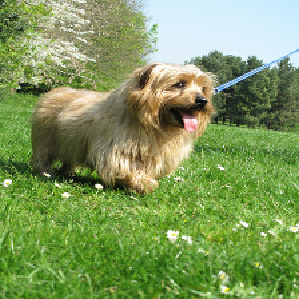</p>
</blockquote></td>
<td><blockquote>
<p>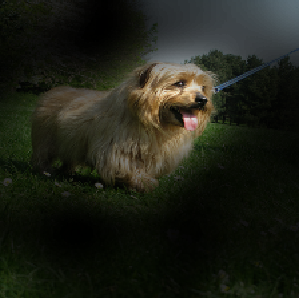</p>
</blockquote></td>
</tr>
<tr class="even">
<td><blockquote>
<p>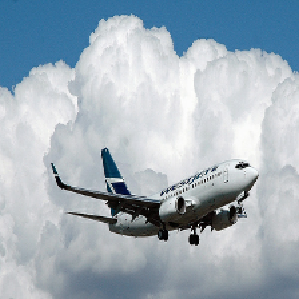</p>
</blockquote></td>
<td><blockquote>
<p>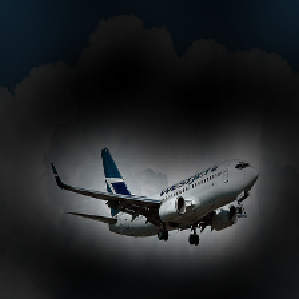</p>
</blockquote></td>
</tr>
<tr class="odd">
<td><blockquote>
<p>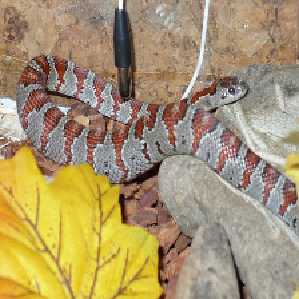</p>
</blockquote></td>
<td><blockquote>
<p>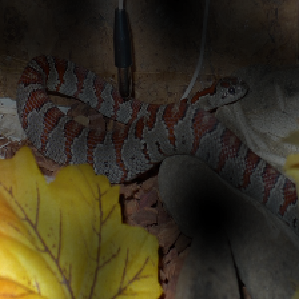</p>
</blockquote></td>
</tr>
</tbody>
</table>

> Self-attention allows ViT to integrate information across the entire
> Figure 6: Representative eximage even in the lowest layers. We
> investigate to what degree amples of attention from the the network
> makes use of this capability. Speciﬁcally, we compute output token to
> the input the average distance in image space across which information
> is space. See Appendix D.7 for integrated, based on the attention
> weights (Figure 7, right). This details.
>
> “attention distance” is analogous to receptive ﬁeld size in CNNs.
>
> We ﬁnd that some heads attend to most of the image already in the
> lowest layers, showing that the ability to integrate information
> globally is indeed used by the model. Other attention heads have
> consistently small attention distances in the low layers. This highly
> localized attention is less pronounced in hybrid models that apply a
> ResNet before the Transformer (Figure 7, right), suggesting that it
> may serve a similar function as early convolutional layers in CNNs.
> Further, the attention distance increases with network depth.
> Globally, we ﬁnd that the model attends to image regions that are
> semantically relevant for classiﬁcation (Figure 6).
>
> 4.6 SELF-SUPERVISION
>
> Transformers show impressive performance on NLP tasks. However, much
> of their success stems not only from their excellent scalability but
> also from large scale self-supervised pre-training (Devlin

8

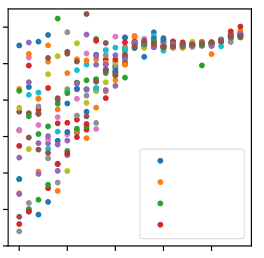

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>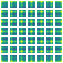</th>
<th><blockquote>
<p>RGB embedding filters</p>
<p>(first 28 principal components)</p>
</blockquote></th>
<th><blockquote>
<p>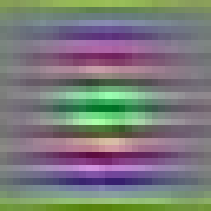</p>
</blockquote></th>
<th>Input patch row</th>
<th>Position embedding similarity</th>
<th><blockquote>
<p>1<br />
Cosine similarity1</p>
</blockquote></th>
<th><blockquote>
<p>Mean attention distance (pixels)</p>
</blockquote></th>
<th>120</th>
<th>0</th>
<th><blockquote>
<p>ViT-L/16</p>
</blockquote></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td>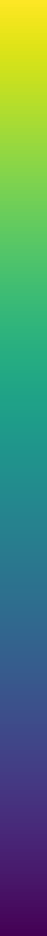</td>
<td>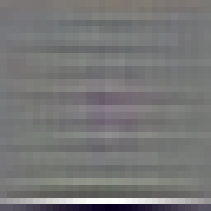</td>
<td>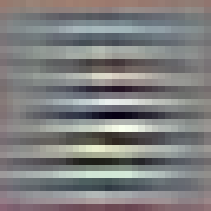</td>
<td>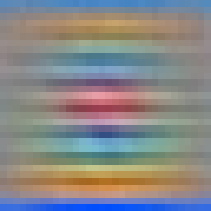</td>
<td>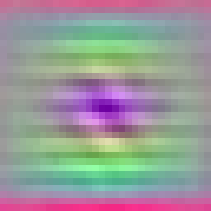</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>1</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>2</p>
</blockquote></td>
<td></td>
<td></td>
<td>100</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td>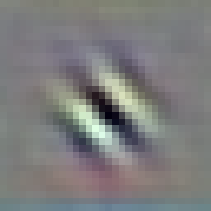</td>
<td>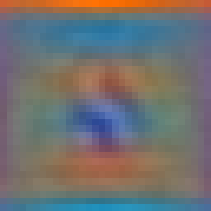</td>
<td>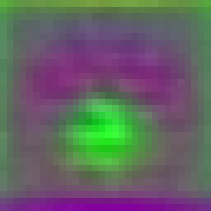</td>
<td>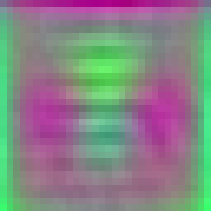</td>
<td>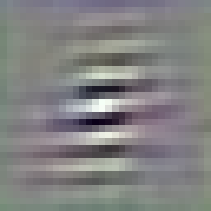</td>
<td>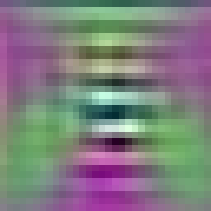</td>
<td><blockquote>
<p>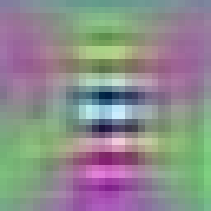</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>3</p>
</blockquote></td>
<td></td>
<td></td>
<td>80</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td>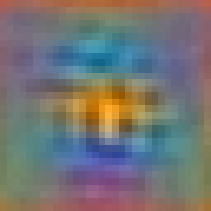</td>
<td>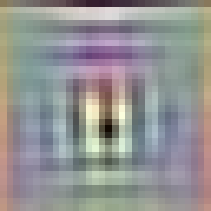</td>
<td>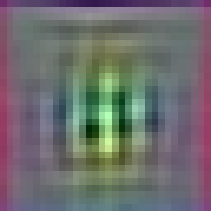</td>
<td>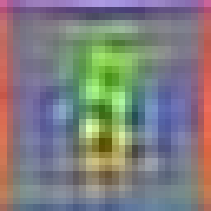</td>
<td>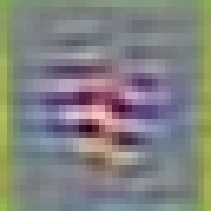</td>
<td>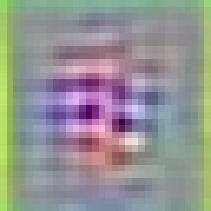</td>
<td><blockquote>
<p>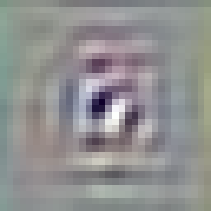</p>
</blockquote></td>
<td></td>
<td><blockquote>
<p>4</p>
</blockquote></td>
<td></td>
<td></td>
<td>60</td>
<td></td>
<td><blockquote>
<p>Head 1<br />
Head 2<br />
Head 3<br />
...</p>
</blockquote></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>5</p>
</blockquote></td>
<td></td>
<td></td>
<td>40</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td>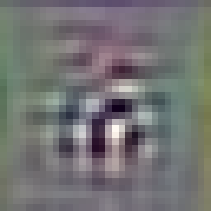</td>
<td>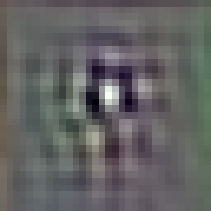</td>
<td>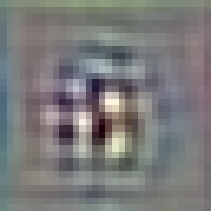</td>
<td>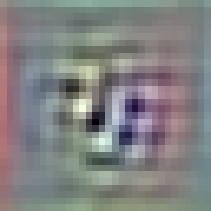</td>
<td>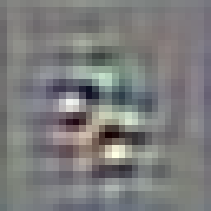</td>
<td>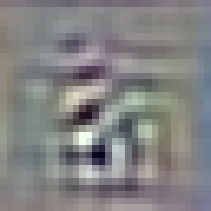</td>
<td><blockquote>
<p>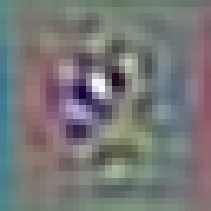</p>
</blockquote></td>
<td></td>
<td><blockquote>
<p>6</p>
</blockquote></td>
<td></td>
<td></td>
<td>20</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td></td>
<td></td>
<td>0</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>1</td>
<td><blockquote>
<p>2 3 4 5 6 Input patch column</p>
</blockquote></td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>5 10 15 20Network depth (layer)</p>
</blockquote></td>
</tr>
</tbody>
</table>

> Figure 7: **Left:** Filters of the initial linear embedding of RGB
> values of ViT-L/32. **Center:** Similarity of position embeddings of
> ViT-L/32. Tiles show the cosine similarity between the position
> embedding of the patch with the indicated row and column and the
> position embeddings of all other patches. **Right:** Size of attended
> area by head and network depth. Each dot shows the mean attention
> distance across images for one of 16 heads at one layer. See Appendix
> D.7 for details.
>
> et al., 2019; Radford et al., 2018). We also perform a preliminary
> exploration on *masked patch prediction* for self-supervision,
> mimicking the masked language modeling task used in BERT. With
> self-supervised pre-training, our smaller ViT-B/16 model achieves
> 79.9% accuracy on ImageNet, a signiﬁcant improvement of 2% to training
> from scratch, but still 4% behind supervised pre-training. Appendix
> B.1.2 contains further details. We leave exploration of contrastive
> pre-training (Chen et al., 2020b; He et al., 2020; Bachman et al.,
> 2019; H´enaff et al., 2020) to future work.

<table>
<tbody>
<tr class="odd">
<td>5</td>
<td><blockquote>
<p>CONCLUSION</p>
</blockquote></td>
</tr>
</tbody>
</table>

> We have explored the direct application of Transformers to image
> recognition. Unlike prior works using self-attention in computer
> vision, we do not introduce image-speciﬁc inductive biases into the
> architecture apart from the initial patch extraction step. Instead, we
> interpret an image as a sequence of patches and process it by a
> standard Transformer encoder as used in NLP. This simple, yet
> scalable, strategy works surprisingly well when coupled with
> pre-training on large datasets. Thus, Vision Transformer matches or
> exceeds the state of the art on many image classiﬁcation datasets,
> whilst being relatively cheap to pre-train.
>
> While these initial results are encouraging, many challenges remain.
> One is to apply ViT to other computer vision tasks, such as detection
> and segmentation. Our results, coupled with those in Carion et al.
> (2020), indicate the promise of this approach. Another challenge is to
> continue exploring selfsupervised pre-training methods. Our initial
> experiments show improvement from self-supervised pre-training, but
> there is still large gap between self-supervised and large-scale
> supervised pretraining. Finally, further scaling of ViT would likely
> lead to improved performance.
>
> ACKNOWLEDGEMENTS
>
> The work was performed in Berlin, Z¨urich, and Amsterdam. We thank
> many colleagues at Google for their help, in particular Andreas
> Steiner for crucial help with the infrastructure and the opensource
> release of the code; Joan Puigcerver and Maxim Neumann for help with
> the large-scale training infrastructure; Dmitry Lepikhin, Aravindh
> Mahendran, Daniel Keysers, Mario Luˇci´c, Noam Shazeer, Ashish
> Vaswani, and Colin Raffel for useful discussions.
>
> REFERENCES
>
> Samira Abnar and Willem Zuidema. Quantifying attention ﬂow in
> transformers. In *ACL*, 2020.
>
> Philip Bachman, R Devon Hjelm, and William Buchwalter. Learning
> representations by maximizing mutual information across views. In
> *NeurIPS*, 2019.

9

> Published as a conference paper at ICLR 2021
>
> Alexei Baevski and Michael Auli. Adaptive input representations for
> neural language modeling. In *ICLR*, 2019.
>
> I. Bello, B. Zoph, Q. Le, A. Vaswani, and J. Shlens. Attention
> augmented convolutional networks. In *ICCV*, 2019.
>
> Lucas Beyer, Olivier J. H´enaff, Alexander Kolesnikov, Xiaohua Zhai,
> and A¨aron van den Oord. Are we done with imagenet? *arXiv*, 2020.
>
> Tom B Brown, Benjamin Mann, Nick Ryder, Melanie Subbiah, Jared Kaplan,
> Prafulla Dhariwal, Arvind Neelakantan, Pranav Shyam, Girish Sastry,
> Amanda Askell, et al. Language models are few-shot learners. *arXiv*,
> 2020.
>
> Nicolas Carion, Francisco Massa, Gabriel Synnaeve, Nicolas Usunier,
> Alexander Kirillov, and Sergey Zagoruyko. End-to-end object detection
> with transformers. In *ECCV*, 2020.
>
> Mark Chen, Alec Radford, Rewon Child, Jeff Wu, and Heewoo Jun.
> Generative pretraining from pixels. In *ICML*, 2020a.
>
> Ting Chen, Simon Kornblith, Mohammad Norouzi, and Geoffrey E. Hinton.
> A simple framework for contrastive learning of visual representations.
> In *ICML*, 2020b.
>
> Yen-Chun Chen, Linjie Li, Licheng Yu, Ahmed El Kholy, Faisal Ahmed,
> Zhe Gan, Yu Cheng, and Jingjing Liu. UNITER: UNiversal Image-TExt
> Representation Learning. In *ECCV*, 2020c.
>
> Rewon Child, Scott Gray, Alec Radford, and Ilya Sutskever. Generating
> long sequences with sparse transformers. *arXiv*, 2019.
>
> Jean-Baptiste Cordonnier, Andreas Loukas, and Martin Jaggi. On the
> relationship between self attention and convolutional layers. In
> *ICLR*, 2020.
>
> J. Deng, W. Dong, R. Socher, L. Li, Kai Li, and Li Fei-Fei. Imagenet:
> A large-scale hierarchical image database. In *CVPR*, 2009.
>
> Jacob Devlin, Ming-Wei Chang, Kenton Lee, and Kristina Toutanova.
> BERT: Pre-training of deep bidirectional transformers for language
> understanding. In *NAACL*, 2019.
>
> Josip Djolonga, Jessica Yung, Michael Tschannen, Rob Romijnders, Lucas
> Beyer, Alexander Kolesnikov, Joan Puigcerver, Matthias Minderer,
> Alexander D’Amour, Dan Moldovan, Sylvan Gelly, Neil Houlsby, Xiaohua
> Zhai, and Mario Lucic. On robustness and transferability of
> convolutional neural networks. *arXiv*, 2020.
>
> Kaiming He, Xiangyu Zhang, Shaoqing Ren, and Jian Sun. Deep residual
> learning for image recog nition. In *CVPR*, 2016.

<table>
<tbody>
<tr class="odd">
<td><blockquote>
<p>Kaiming He, Haoqi Fan, Yuxin Wu, Saining Xie, and Ross Girshick. unsupervised visual representation learning. In <em>CVPR</em>, 2020.</p>
</blockquote></td>
<td><blockquote>
<p>Momentum contrast for</p>
</blockquote></td>
</tr>
</tbody>
</table>

> Jonathan Ho, Nal Kalchbrenner, Dirk Weissenborn, and Tim Salimans.
> Axial attention in multidi mensional transformers. *arXiv*, 2019.
>
> Han Hu, Jiayuan Gu, Zheng Zhang, Jifeng Dai, and Yichen Wei. Relation
> networks for object detection. In *CVPR*, 2018.
>
> Han Hu, Zheng Zhang, Zhenda Xie, and Stephen Lin. Local relation
> networks for image recognition. In *ICCV*, 2019.
>
> Zilong Huang, Xinggang Wang, Yunchao Wei, Lichao Huang, Humphrey Shi,
> Wenyu Liu, and Thomas S. Huang. Ccnet: Criss-cross attention for
> semantic segmentation. In *ICCV*, 2020.
>
> Olivier J. H´enaff, Aravind Srinivas, Jeffrey De Fauw, Ali Razavi,
> Carl Doersch, S. M. Ali Eslami, and Aaron van den Oord. Data-efﬁcient
> image recognition with contrastive predictive coding. In *ICML*, 2020.

10

> Published as a conference paper at ICLR 2021
>
> Sergey Ioffe and Christian Szegedy. Batch normalization: Accelerating
> deep network training by reducing internal covariate shift. 2015.
>
> Diederik P. Kingma and Jimmy Ba. Adam: A method for stochastic
> optimization. In *ICLR*, 2015.
>
> Alexander Kolesnikov, Lucas Beyer, Xiaohua Zhai, Joan Puigcerver,
> Jessica Yung, Sylvain Gelly, and Neil Houlsby. Big transfer (BiT):
> General visual representation learning. In *ECCV*, 2020.
>
> Alex Krizhevsky. Learning multiple layers of features from tiny
> images. Technical report, 2009.
>
> Alex Krizhevsky, Ilya Sutskever, and Geoffrey E. Hinton. Imagenet
> classiﬁcation with deep convo lutional neural networks. In *NIPS*,
> 2012.
>
> Y. LeCun, B. Boser, J. Denker, D. Henderson, R. Howard, W. Hubbard,
> and L. Jackel. Backpropa gation applied to handwritten zip code
> recognition. *Neural Computation*, 1:541–551, 1989.
>
> Dmitry Lepikhin, HyoukJoong Lee, Yuanzhong Xu, Dehao Chen, Orhan
> Firat, Yanping Huang, Maxim Krikun, Noam Shazeer, and Zhifeng Chen.
> Gshard: Scaling giant models with conditional computation and
> automatic sharding. *arXiv*, 2020.
>
> Liunian Harold Li, Mark Yatskar, Da Yin, Cho-Jui Hsieh, and Kai-Wei
> Chang. VisualBERT: A Simple and Performant Baseline for Vision and
> Language. In *Arxiv*, 2019.
>
> Francesco Locatello, Dirk Weissenborn, Thomas Unterthiner, Aravindh
> Mahendran, Georg Heigold, Jakob Uszkoreit, Alexey Dosovitskiy, and
> Thomas Kipf. Object-centric learning with slot attention. *arXiv*,
> 2020.
>
> Jiasen Lu, Dhruv Batra, Devi Parikh, and Stefan Lee. ViLBERT:
> Pretraining Task-Agnostic Visi olinguistic Representations for
> Vision-and-Language Tasks. In *NeurIPS*. 2019.
>
> Dhruv Mahajan, Ross Girshick, Vignesh Ramanathan, Kaiming He, Manohar
> Paluri, Yixuan Li, Ashwin Bharambe, and Laurens van der Maaten.
> Exploring the limits of weakly supervised pretraining. In *ECCV*,
> 2018.
>
> M. Nilsback and A. Zisserman. Automated ﬂower classiﬁcation over a
> large number of classes. In *ICVGIP*, 2008.
>
> Omkar M. Parkhi, Andrea Vedaldi, Andrew Zisserman, and C. V. Jawahar.
> Cats and dogs. In *CVPR*, 2012.
>
> Niki Parmar, Ashish Vaswani, Jakob Uszkoreit, Lukasz Kaiser, Noam
> Shazeer, Alexander Ku, and Dustin Tran. Image transformer. In *ICML*,
> 2018.
>
> B. T. Polyak and A. B. Juditsky. Acceleration of stochastic
> approximation by averaging. *SIAM* *Journal on Control and
> Optimization*, 30(4):838–855, 1992. doi: 10.1137/0330046. URL .
>
> Siyuan Qiao, Huiyu Wang, Chenxi Liu, Wei Shen, and Alan Yuille. Weight
> standardization. *arXiv* *preprint arXiv:1903.10520*, 2019.
>
> Alec Radford, Karthik Narasimhan, Tim Salimans, and Ilya Sutskever.
> Improving language under standing with unsupervised learning.
> *Technical Report*, 2018.
>
> Alec Radford, Jeff Wu, Rewon Child, David Luan, Dario Amodei, and Ilya
> Sutskever. Language models are unsupervised multitask learners.
> *Technical Report*, 2019.
>
> Prajit Ramachandran, Niki Parmar, Ashish Vaswani, Irwan Bello, Anselm
> Levskaya, and Jon Shlens. Stand-alone self-attention in vision models.
> In *NeurIPS*, 2019.
>
> Chen Sun, Abhinav Shrivastava, Saurabh Singh, and Abhinav Gupta.
> Revisiting unreasonable ef fectiveness of data in deep learning era.
> In *ICCV*, 2017.
>
> Chen Sun, Austin Myers, Carl Vondrick, Kevin Murphy, and Cordelia
> Schmid. Videobert: A joint model for video and language representation
> learning. In *ICCV*, 2019.

11

> Published as a conference paper at ICLR 2021
>
> Hugo Touvron, Andrea Vedaldi, Matthijs Douze, and Herve Jegou. Fixing
> the train-test resolution discrepancy. In *NeurIPS*. 2019.
>
> Hugo Touvron, Andrea Vedaldi, Matthijs Douze, and Herve Jegou. Fixing
> the train-test resolution discrepancy: Fixefﬁcientnet. *arXiv preprint
> arXiv:2003.08237*, 2020.
>
> Michael Tschannen, Josip Djolonga, Marvin Ritter, Aravindh Mahendran,
> Neil Houlsby, Sylvain Gelly, and Mario Lucic. Self-supervised learning
> of video-induced visual invariances. In *Proceedings of the IEEE/CVF
> Conference on Computer Vision and Pattern Recognition (CVPR)*, June
> 2020.
>
> Ashish Vaswani, Noam Shazeer, Niki Parmar, Jakob Uszkoreit, Llion
> Jones, Aidan N Gomez, Łukasz Kaiser, and Illia Polosukhin. Attention
> is all you need. In *NIPS*, 2017.
>
> Huiyu Wang, Yukun Zhu, Bradley Green, Hartwig Adam, Alan Yuille, and
> Liang-Chieh Chen. Axial-deeplab: Stand-alone axial-attention for
> panoptic segmentation. In *ECCV*, 2020a.
>
> Huiyu Wang, Yukun Zhu, Bradley Green, Hartwig Adam, Alan Yuille, and
> Liang-Chieh Chen. Axial-deeplab: Stand-alone axial-attention for
> panoptic segmentation. *arXiv preprint* *arXiv:2003.07853*, 2020b.
>
> Qiang Wang, Bei Li, Tong Xiao, Jingbo Zhu, Changliang Li, Derek F.
> Wong, and Lidia S. Chao. Learning deep transformer models for machine
> translation. In *ACL*, 2019.
>
> Xiaolong Wang, Ross Girshick, Abhinav Gupta, and Kaiming He. Non-local
> neural networks. In *CVPR*, 2018.
>
> Dirk Weissenborn, Oscar T¨ackstr¨om, and Jakob Uszkoreit. Scaling
> autoregressive video models. In *ICLR*, 2019.
>
> Bichen Wu, Chenfeng Xu, Xiaoliang Dai, Alvin Wan, Peizhao Zhang,
> Masayoshi Tomizuka, Kurt Keutzer, and Peter Vajda. Visual
> transformers: Token-based image representation and processing for
> computer vision. *arxiv*, 2020.
>
> Yuxin Wu and Kaiming He. Group normalization. In *ECCV*, 2018.
>
> Qizhe Xie, Minh-Thang Luong, Eduard Hovy, and Quoc V. Le.
> Self-training with noisy student improves imagenet classiﬁcation. In
> *CVPR*, 2020.
>
> Xiaohua Zhai, Avital Oliver, Alexander Kolesnikov, and Lucas Beyer.
> S**4**L: Self-Supervised Semi- Supervised Learning. In *ICCV*, 2019a.
>
> Xiaohua Zhai, Joan Puigcerver, Alexander Kolesnikov, Pierre Ruyssen,
> Carlos Riquelme, Mario Lucic, Josip Djolonga, Andre Susano Pinto,
> Maxim Neumann, Alexey Dosovitskiy, et al. A large-scale study of
> representation learning with the visual task adaptation benchmark.
> *arXiv preprint arXiv:1910.04867*, 2019b.
>
> Hengshuang Zhao, Jiaya Jia, and Vladlen Koltun. Exploring
> self-attention for image recognition. In *CVPR*, 2020.

12

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th><blockquote>
<p>Models</p>
</blockquote></th>
<th><blockquote>
<p>Dataset</p>
</blockquote></th>
<th>Epochs</th>
<th>Base LR</th>
<th>LR decay</th>
<th>Weight decay</th>
<th><blockquote>
<p>Dropout</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>ViT-B/<em>{</em>16,32<em>}</em> ViT-L/32</td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7</td>
<td><blockquote>
<p>8 <em>·</em> 10<em>−</em>4 6 <em>·</em> 10<em>−</em>4 4 <em>·</em> 10<em>−</em>4 3 <em>·</em> 10<em>−</em>4 10<em>−</em>3</p>
</blockquote></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7</td>
<td></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="odd">
<td><blockquote>
<p>ViT-L/16</p>
</blockquote></td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7/14</td>
<td></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="even">
<td><blockquote>
<p>ViT-H/14</p>
</blockquote></td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>14</td>
<td></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="odd">
<td><blockquote>
<p>R50x<em>{</em>1,2<em>}</em> R101x1</p>
</blockquote></td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7</td>
<td></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7</td>
<td><blockquote>
<p>8 <em>·</em> 10<em>−</em>4 6 <em>·</em> 10<em>−</em>4 8 <em>·</em> 10<em>−</em>4 2 <em>·</em> 10<em>−</em>4 4 <em>·</em> 10<em>−</em>4 10<em>−</em>3</p>
</blockquote></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="odd">
<td><blockquote>
<p>R152x<em>{</em>1,2<em>}</em><br />
R50+ViT-B/<em>{</em>16,32<em>}</em> R50+ViT-L/32</p>
</blockquote></td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7</td>
<td></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7</td>
<td></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="odd">
<td></td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7</td>
<td></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="even">
<td>R50+ViT-L/16</td>
<td><blockquote>
<p>JFT-300M</p>
</blockquote></td>
<td>7/14</td>
<td></td>
<td>linear</td>
<td>0.1</td>
<td>0.0</td>
</tr>
<tr class="odd">
<td><blockquote>
<p>ViT-B/<em>{</em>16,32<em>}</em> ViT-L/<em>{</em>16,32<em>}</em> ViT-<em>∗</em></p>
</blockquote></td>
<td>ImageNet-21k</td>
<td>90</td>
<td></td>
<td>linear</td>
<td>0.03</td>
<td>0.1</td>
</tr>
<tr class="even">
<td></td>
<td>ImageNet-21k</td>
<td>30/90</td>
<td>10<em>−</em>3</td>
<td>linear</td>
<td>0.03</td>
<td>0.1</td>
</tr>
<tr class="odd">
<td></td>
<td><blockquote>
<p>ImageNet</p>
</blockquote></td>
<td>300</td>
<td>3 <em>·</em> 10<em>−</em>3</td>
<td>cosine</td>
<td>0.3</td>
<td>0.1</td>
</tr>
</tbody>
</table>

> Table 3: Hyperparameters for training. All models are trained with a
> batch size of 4096 and learning rate warmup of 10k steps. For ImageNet
> we found it beneﬁcial to additionally apply gradient clipping at
> global norm 1. Training resolution is 224.
>
> APPENDIX
>
> A MULTIHEAD SELF-ATTENTION
>
> Standard **qkv** self-attention (SA, Vaswani et al. (2017)) is a
> popular building block for neural architectures. For each element in
> an input sequence **z** *∈* R*N×D*, we compute a weighted sum over all
> values **v** in the sequence. The attention weights *Aij* are based on
> the pairwise similarity between two elements of the sequence and their
> respective query **q***i*and key **k***j*representations.

<table>
<thead>
<tr class="header">
<th>[<strong>q</strong><em>,</em> <strong>k</strong><em>,</em> <strong>v</strong>] = <strong>zU</strong><em>qkv</em></th>
<th><blockquote>
<p>�<strong>qk</strong><em>⊤/</em>�<em>Dh</em>�</p>
</blockquote></th>
<th><blockquote>
<p><strong>U</strong><em>qkv ∈</em> R<em>D×</em>3<em>Dh,</em></p>
</blockquote></th>
<th>(5)</th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td><em>A</em> = softmax</td>
<td></td>
<td></td>
<td>(6)</td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td><em>A ∈</em> R<em>N×N,</em></td>
<td></td>
</tr>
<tr class="odd">
<td>SA(<strong>z</strong>) = <em>A</em><strong>v</strong> <em>.</em></td>
<td></td>
<td></td>
<td>(7)</td>
</tr>
</tbody>
</table>

> Multihead self-attention (MSA) is an extension of SA in which we run
> *k* self-attention operations, called “heads”, in parallel, and
> project their concatenated outputs. To keep compute and number of
> parameters constant when changing *k*, *Dh* (Eq. 5) is typically set
> to *D/k*.

<table>
<thead>
<tr class="header">
<th>B</th>
<th>MSA(<strong>z</strong>) = [SA1(<em>z</em>); SA2(<em>z</em>); <em>· · ·</em> ; SA<em>k</em>(<em>z</em>)] <strong>U</strong><em>msa</em></th>
<th><blockquote>
<p><strong>U</strong><em>msa ∈</em> R<em>k·Dh×D</em></p>
</blockquote></th>
<th>(8)</th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td><blockquote>
<p>EXPERIMENT DETAILS</p>
</blockquote></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td>B.1</td>
<td><blockquote>
<p>TRAINING</p>
</blockquote></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

> Table 3 summarizes our training setups for our different models. We
> found strong regularization to be key when training models from
> scratch on ImageNet. Dropout, when used, is applied after every dense
> layer except for the the qkv-projections and directly after adding
> positional- to patch embeddings. Hybrid models are trained with the
> exact setup as their ViT counterparts. Finally, all training is done
> on resolution 224.
>
> B.1.1 FINE-TUNING
>
> We ﬁne-tune all ViT models using SGD with a momentum of 0.9. We run a
> small grid search over learning rates, see learning rate ranges in
> Table 4. To do so, we use small sub-splits from the training set (10%
> for Pets and Flowers, 2% for CIFAR, 1% ImageNet) as development set
> and train on the remaining data. For ﬁnal results we train on the
> entire training set and evaluate on the respective test data. For
> ﬁne-tuning ResNets and hybrid models we use the exact same setup, with
> the only exception of ImageNet where we add another value 0*.*06 to
> the learning rate sweep. Additionally,

13

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>Dataset</th>
<th>Steps</th>
<th><blockquote>
<p>Base LR</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>ImageNet</td>
<td>20 000</td>
<td><blockquote>
<p><em>{</em>0.003, 0.01, 0.03, 0.06<em>} {</em>0.001, 0.003, 0.01, 0.03<em>} {</em>0.001, 0.003, 0.01, 0.03<em>} {</em>0.001, 0.003, 0.01, 0.03<em>} {</em>0.001, 0.003, 0.01, 0.03<em>}</em> 0.01</p>
</blockquote></td>
</tr>
<tr class="even">
<td>CIFAR100</td>
<td>10 000</td>
<td></td>
</tr>
<tr class="odd">
<td>CIFAR10</td>
<td>10 000</td>
<td></td>
</tr>
<tr class="even">
<td>Oxford-IIIT Pets</td>
<td>500</td>
<td></td>
</tr>
<tr class="odd">
<td>Oxford Flowers-102</td>
<td>500</td>
<td></td>
</tr>
<tr class="even">
<td>VTAB (19 tasks)</td>
<td>2 500</td>
<td></td>
</tr>
</tbody>
</table>

> Table 4: Hyperparameters for ﬁne-tuning. All models are ﬁne-tuned with
> cosine learning rate decay, a batch size of 512, no weight decay, and
> grad clipping at global norm 1. If not mentioned otherwise, ﬁne-tuning
> resolution is 384.
>
> for ResNets we also run the setup of Kolesnikov et al. (2020) and
> select the best results across this run and our sweep. Finally, if not
> mentioned otherwise, all ﬁne-tuning experiments run at 384 resolution
> (running ﬁne-tuning at different resolution than training is common
> practice (Kolesnikov et al., 2020)).
>
> When transferring ViT models to another dataset, we remove the whole
> head (two linear layers) and replace it by a single, zero-initialized
> linear layer outputting the number of classes required by the target
> dataset. We found this to be a little more robust than simply
> re-initializing the very last layer.
>
> For VTAB we follow the protocol in Kolesnikov et al. (2020), and use
> the same hyperparameter setting for all tasks. We use a learning rate
> of 0*.*01 and train for 2500 steps (Tab. 4). We chose this setting by
> running a small sweep over two learning rates and two schedules, and
> selecting the setting with the highest VTAB score on the 200-example
> validation sets. We follow the pre-processing used in Kolesnikov et
> al. (2020), except that we do not use task-speciﬁc input resolutions.
> Instead we ﬁnd that Vision Transformer beneﬁts most from a high
> resolution (384 *×* 384) for all tasks.
>
> B.1.2 SELF-SUPERVISION
>
> We employ the *masked patch prediction* objective for preliminary
> self-supervision experiments. To do so we corrupt 50% of patch
> embeddings by either replacing their embeddings with a learnable
> \[mask\] embedding (80%), a random other patch embedding (10%) or just
> keeping them as is (10%). This setup is very similar to the one used
> for language by Devlin et al. (2019). Finally, we predict the 3-bit,
> mean color (i.e., 512 colors in total) of every corrupted patch using
> their respective patch representations.
>
> We trained our self-supervised model for 1M steps (ca. 14 epochs) with
> batch size 4096 on JFT. We use Adam, with a base learning rate of
> 2*·*10*−*4, warmup of 10k steps and cosine learning rate decay. As
> prediction targets for pretraining we tried the following settings: 1)
> predicting only the mean, 3bit color (i.e., 1 prediction of 512
> colors), 2) predicting a 4 *×* 4 downsized version of the 16 *×* 16
> patch with 3bit colors in parallel (i.e., 16 predictions of 512
> colors), 3) regression on the full patch using L2 (i.e., 256
> regressions on the 3 RGB channels). Surprisingly, we found that all
> worked quite well, though L2 was slightly worse. We report ﬁnal
> results only for option 1) because it has shown best few-shot
> performance. We also experimented with 15% corruption rate as used by
> Devlin et al. (2019) but results were also slightly worse on our
> few-shot metrics.
>
> Lastly, we would like to remark that our instantiation of masked patch
> prediction doesn’t require such an enormous amount of pretraining nor
> a large dataset such as JFT in order to lead to similar performance
> gains on ImageNet classiﬁcation. That is, we observed diminishing
> returns on downstream performance after 100k pretraining steps, and
> see similar gains when pretraining on ImageNet.
>
> C ADDITIONAL RESULTS
>
> We report detailed results corresponding to the ﬁgures presented in
> the paper. Table 5 corresponds to Figure 3 from the paper and shows
> transfer performance of different ViT models pre-trained on datasets
> of increasing size: ImageNet, ImageNet-21k, and JFT-300M. Table 6
> corresponds to

14

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>ImageNet</th>
<th><blockquote>
<p>CIFAR-10</p>
</blockquote></th>
<th>ViT-B/16</th>
<th>ViT-B/32</th>
<th>ViT-L/16</th>
<th>ViT-L/32</th>
<th><blockquote>
<p>ViT-H/14</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td></td>
<td>98.13</td>
<td>97.77</td>
<td>97.86</td>
<td>97.94</td>
<td><blockquote>
<p>-</p>
</blockquote></td>
</tr>
<tr class="even">
<td>ImageNet-21k</td>
<td><blockquote>
<p>CIFAR-100</p>
</blockquote></td>
<td>87.13</td>
<td>86.31</td>
<td>86.35</td>
<td>87.07</td>
<td><blockquote>
<p>-</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td><blockquote>
<p>ImageNet</p>
</blockquote></td>
<td>77.91</td>
<td>73.38</td>
<td>76.53</td>
<td>71.16</td>
<td><blockquote>
<p>-</p>
</blockquote></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>ImageNet ReaL</p>
</blockquote></td>
<td>83.57</td>
<td>79.56</td>
<td>82.19</td>
<td>77.83</td>
<td><blockquote>
<p>-</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td>Oxford Flowers-102</td>
<td>89.49</td>
<td>85.43</td>
<td>89.66</td>
<td>86.36</td>
<td><blockquote>
<p>-</p>
</blockquote></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>Oxford-IIIT-Pets</p>
</blockquote></td>
<td>93.81</td>
<td>92.04</td>
<td>93.64</td>
<td>91.35</td>
<td><blockquote>
<p>-</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td><blockquote>
<p>CIFAR-10</p>
</blockquote></td>
<td>98.95</td>
<td>98.79</td>
<td>99.16</td>
<td>99.13</td>
<td><blockquote>
<p>99.27</p>
</blockquote></td>
</tr>
<tr class="even">
<td>JFT-300M</td>
<td><blockquote>
<p>CIFAR-100</p>
</blockquote></td>
<td>91.67</td>
<td>91.97</td>
<td>93.44</td>
<td>93.04</td>
<td><blockquote>
<p>93.82</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td><blockquote>
<p>ImageNet</p>
</blockquote></td>
<td>83.97</td>
<td>81.28</td>
<td>85.15</td>
<td>80.99</td>
<td><blockquote>
<p>85.13</p>
</blockquote></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>ImageNet ReaL</p>
</blockquote></td>
<td>88.35</td>
<td>86.63</td>
<td>88.40</td>
<td>85.65</td>
<td><blockquote>
<p>88.70</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td>Oxford Flowers-102</td>
<td>99.38</td>
<td>99.11</td>
<td>99.61</td>
<td>99.19</td>
<td><blockquote>
<p>99.51</p>
</blockquote></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>Oxford-IIIT-Pets</p>
</blockquote></td>
<td>94.43</td>
<td>93.02</td>
<td>94.73</td>
<td>93.09</td>
<td><blockquote>
<p>94.82</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td><blockquote>
<p>CIFAR-10</p>
</blockquote></td>
<td>99.00</td>
<td>98.61</td>
<td>99.38</td>
<td>99.19</td>
<td><blockquote>
<p>99.50</p>
</blockquote></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>CIFAR-100</p>
</blockquote></td>
<td>91.87</td>
<td>90.49</td>
<td>94.04</td>
<td>92.52</td>
<td><blockquote>
<p>94.55</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td><blockquote>
<p>ImageNet</p>
</blockquote></td>
<td>84.15</td>
<td>80.73</td>
<td>87.12</td>
<td>84.37</td>
<td><blockquote>
<p>88.04</p>
</blockquote></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>ImageNet ReaL</p>
</blockquote></td>
<td>88.85</td>
<td>86.27</td>
<td>89.99</td>
<td>88.28</td>
<td><blockquote>
<p>90.33</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td>Oxford Flowers-102</td>
<td>99.56</td>
<td>99.27</td>
<td>99.56</td>
<td>99.45</td>
<td><blockquote>
<p>99.68</p>
</blockquote></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>Oxford-IIIT-Pets</p>
</blockquote></td>
<td>95.80</td>
<td>93.40</td>
<td>97.11</td>
<td>95.83</td>
<td><blockquote>
<p>97.56</p>
</blockquote></td>
</tr>
</tbody>
</table>

> Table 5: Top1 accuracy (in %) of Vision Transformer on various
> datasets when pre-trained on ImageNet, ImageNet-21k or JFT300M. These
> values correspond to Figure 3 in the main text. Models are ﬁne-tuned
> at 384 resolution. Note that the ImageNet results are computed without
> additional techniques (Polyak averaging and 512 resolution images)
> used to achieve results in Table 2.

<table>
<thead>
<tr class="header">
<th>name</th>
<th>Epochs</th>
<th>ImageNet</th>
<th>ImageNet ReaL</th>
<th>CIFAR-10</th>
<th>CIFAR-100</th>
<th>Pets</th>
<th>Flowers</th>
<th><blockquote>
<p>exaFLOPs</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>ViT-B/32</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>80.73</td>
<td>86.27</td>
<td>98.61</td>
<td>90.49</td>
<td>93.40</td>
<td>99.27</td>
<td>55</td>
</tr>
<tr class="even">
<td>ViT-B/16</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>84.15</td>
<td>88.85</td>
<td>99.00</td>
<td>91.87</td>
<td>95.80</td>
<td>99.56</td>
<td>224</td>
</tr>
<tr class="odd">
<td>ViT-L/32</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>84.37</td>
<td>88.28</td>
<td>99.19</td>
<td>92.52</td>
<td>95.83</td>
<td>99.45</td>
<td>196</td>
</tr>
<tr class="even">
<td>ViT-L/16</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>86.30</td>
<td>89.43</td>
<td>99.38</td>
<td>93.46</td>
<td>96.81</td>
<td>99.66</td>
<td>783</td>
</tr>
<tr class="odd">
<td>ViT-L/16</td>
<td><blockquote>
<p>14</p>
</blockquote></td>
<td>87.12</td>
<td>89.99</td>
<td>99.38</td>
<td>94.04</td>
<td>97.11</td>
<td>99.56</td>
<td><blockquote>
<p>1567</p>
</blockquote></td>
</tr>
<tr class="even">
<td>ViT-H/14</td>
<td><blockquote>
<p>14</p>
</blockquote></td>
<td>88.08</td>
<td>90.36</td>
<td>99.50</td>
<td>94.71</td>
<td>97.11</td>
<td>99.71</td>
<td><blockquote>
<p>4262</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>ResNet50x1</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>77.54</td>
<td>84.56</td>
<td>97.67</td>
<td>86.07</td>
<td>91.11</td>
<td>94.26</td>
<td>50</td>
</tr>
<tr class="even">
<td>ResNet50x2</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>82.12</td>
<td>87.94</td>
<td>98.29</td>
<td>89.20</td>
<td>93.43</td>
<td>97.02</td>
<td>199</td>
</tr>
<tr class="odd">
<td>ResNet101x1</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>80.67</td>
<td>87.07</td>
<td>98.48</td>
<td>89.17</td>
<td>94.08</td>
<td>95.95</td>
<td>96</td>
</tr>
<tr class="even">
<td>ResNet152x1</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>81.88</td>
<td>87.96</td>
<td>98.82</td>
<td>90.22</td>
<td>94.17</td>
<td>96.94</td>
<td>141</td>
</tr>
<tr class="odd">
<td>ResNet152x2</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>84.97</td>
<td>89.69</td>
<td>99.06</td>
<td>92.05</td>
<td>95.37</td>
<td>98.62</td>
<td>563</td>
</tr>
<tr class="even">
<td>ResNet152x2</td>
<td><blockquote>
<p>14</p>
</blockquote></td>
<td>85.56</td>
<td>89.89</td>
<td>99.24</td>
<td>91.92</td>
<td>95.75</td>
<td>98.75</td>
<td><blockquote>
<p>1126</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>ResNet200x3</td>
<td><blockquote>
<p>14</p>
</blockquote></td>
<td>87.22</td>
<td>90.15</td>
<td>99.34</td>
<td>93.53</td>
<td>96.32</td>
<td>99.04</td>
<td><blockquote>
<p>3306</p>
</blockquote></td>
</tr>
<tr class="even">
<td>R50x1+ViT-B/32</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>84.90</td>
<td>89.15</td>
<td>99.01</td>
<td>92.24</td>
<td>95.75</td>
<td>99.46</td>
<td>106</td>
</tr>
<tr class="odd">
<td>R50x1+ViT-B/16</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>85.58</td>
<td>89.65</td>
<td>99.14</td>
<td>92.63</td>
<td>96.65</td>
<td>99.40</td>
<td>274</td>
</tr>
<tr class="even">
<td>R50x1+ViT-L/32</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>85.68</td>
<td>89.04</td>
<td>99.24</td>
<td>92.93</td>
<td>96.97</td>
<td>99.43</td>
<td>246</td>
</tr>
<tr class="odd">
<td>R50x1+ViT-L/16</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
<td>86.60</td>
<td>89.72</td>
<td>99.18</td>
<td>93.64</td>
<td>97.03</td>
<td>99.40</td>
<td>859</td>
</tr>
<tr class="even">
<td>R50x1+ViT-L/16</td>
<td><blockquote>
<p>14</p>
</blockquote></td>
<td>87.12</td>
<td>89.76</td>
<td>99.31</td>
<td>93.89</td>
<td>97.36</td>
<td>99.11</td>
<td><blockquote>
<p>1668</p>
</blockquote></td>
</tr>
</tbody>
</table>

> Table 6: Detailed results of model scaling experiments. These
> correspond to Figure 5 in the main paper. We show transfer accuracy on
> several datasets, as well as the pre-training compute (in exaFLOPs).
>
> Figure 5 from the paper and shows the transfer performance of ViT,
> ResNet, and hybrid models of varying size, as well as the estimated
> computational cost of their pre-training.

<table>
<thead>
<tr class="header">
<th>D</th>
<th><blockquote>
<p>ADDITIONAL ANALYSES</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>D.1</td>
<td><blockquote>
<p>SGD VS. ADAM FOR RESNETS</p>
</blockquote></td>
</tr>
</tbody>
</table>

> ResNets are typically trained with SGD and our use of Adam as
> optimizer is quite unconventional. Here we show the experiments that
> motivated this choice. Namely, we compare the ﬁne-tuning

15

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>Dataset</th>
<th>ResNet50</th>
<th><blockquote>
<p>ResNet152x2</p>
</blockquote></th>
<th></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td><blockquote>
<p>Adam</p>
</blockquote></td>
<td>SGD</td>
<td><blockquote>
<p>Adam</p>
</blockquote></td>
<td><blockquote>
<p>SGD</p>
</blockquote></td>
</tr>
<tr class="even">
<td>ImageNet</td>
<td><blockquote>
<p>77<em>.</em>54</p>
</blockquote></td>
<td>78<em>.</em>24</td>
<td><blockquote>
<p>84<em>.</em>97</p>
</blockquote></td>
<td><blockquote>
<p>84<em>.</em>37</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>CIFAR10</td>
<td><blockquote>
<p>97<em>.</em>67</p>
</blockquote></td>
<td>97<em>.</em>46</td>
<td><blockquote>
<p>99<em>.</em>06</p>
</blockquote></td>
<td><blockquote>
<p>99<em>.</em>07</p>
</blockquote></td>
</tr>
<tr class="even">
<td>CIFAR100</td>
<td><blockquote>
<p>86<em>.</em>07</p>
</blockquote></td>
<td>85<em>.</em>17</td>
<td><blockquote>
<p>92<em>.</em>05</p>
</blockquote></td>
<td><blockquote>
<p>91<em>.</em>06</p>
</blockquote></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

<table>
<thead>
<tr class="header">
<th><blockquote>
<p>shot</p>
</blockquote>
<p>0.5</p></th>
<th><blockquote>
<p>Oxford-IIITOxford FlowAverage</p>
<p>Table 7: Fine-tuning</p>
</blockquote>
<p>100</p>
<p>Relative Compute</p></th>
<th><table>
<tbody>
<tr class="odd">
<td><p>Pets<br />
ers-102</p>
<p>ResNet</p></td>
<td><blockquote>
<p>919489</p>
</blockquote>
<p>mo</p></td>
</tr>
</tbody>
</table>
<blockquote>
<p>Models<br />
All<br />
Depth<br />
Patch size Width MLP Width</p>
</blockquote></th>
<th><blockquote>
<p><em>.</em>11 91<em>.</em>00 <em>.</em>26 92<em>.</em>06 <em>.</em>33 88<em>.</em>79</p>
</blockquote>
<p>dels pre-traine</p>
<blockquote>
<p>0.7<br />
e 5shot<br />
0.6</p>
</blockquote></th>
<th><table>
<tbody>
<tr class="odd">
<td><blockquote>
<p>95<em>.</em>37 98<em>.</em>62 94<em>.</em>01</p>
</blockquote></td>
<td><blockquote>
<p>94<em>.</em>79<br />
99<em>.</em>32<br />
93<em>.</em>72</p>
</blockquote></td>
</tr>
</tbody>
</table>
<p>d with Adam and SGD</p>
<p>100</p>
<p>Relative Compute</p></th>
<th><blockquote>
<p>.</p>
<p>Models<br />
All<br />
Depth<br />
Patch size<br />
Width MLP<br />
Width</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td><p>et 5</p>
<p>0.4</p></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td><p>mageN</p>
<p>0.3</p></td>
<td></td>
<td></td>
<td>ag</td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td><p>Aver</p>
<p>0.5</p></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td><p>I</p>
<p>0.2</p></td>
<td></td>
<td></td>
<td>0.4</td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td>101</td>
<td></td>
<td></td>
<td>101</td>
</tr>
</tbody>
</table>

Figure 8: Scaling different model dimensions of the Vision Transformer.

> performance of two ResNets – 50x1 and 152x2 – pre-trained on JFT with
> SGD and Adam. For SGD, we use the hyperparameters recommended by
> Kolesnikov et al. (2020). Results are presented in Table 7. Adam
> pre-training outperforms SGD pre-training on most datasets and on
> average. This justiﬁes the choice of Adam as the optimizer used to
> pre-train ResNets on JFT. Note that the absolute numbers are lower
> than those reported by Kolesnikov et al. (2020), since we pre-train
> only for 7 epochs, not 30.
>
> D.2 TRANSFORMER SHAPE
>
> We ran ablations on scaling different dimensions of the Transformer
> architecture to ﬁnd out which are best suited for scaling to very
> large models. Figure 8 shows 5-shot performance on ImageNet for
> different conﬁgurations. All conﬁgurations are based on a ViT model
> with 8 layers, *D* = 1024, *DMLP* = 2048 and a patch size of 32, the
> intersection of all lines. We can see that scaling the depth results
> in the biggest improvements which are clearly visible up until 64
> layers. However, diminishing returns are already visible after 16
> layers. Interestingly, scaling the width of the network seems to
> result in the smallest changes. Decreasing the patch size and thus
> increasing the effective sequence length shows surprisingly robust
> improvements without introducing parameters. These ﬁndings suggest
> that compute might be a better predictor of performance than the
> number of parameters, and that scaling should emphasize depth over
> width if any. Overall, we ﬁnd that scaling all dimensions
> proportionally results in robust improvements.
>
> D.3 HEAD TYPE AND CLASS TOKEN
>
> In order to stay as close as possible to the original Transformer
> model, we made use of an additional \[class\] token, which is taken as
> image representation. The output of this token is then transformed
> into a class prediction via a small multi-layer perceptron (MLP) with
> tanh as non-linearity in the single hidden layer.
>
> This design is inherited from the Transformer model for text, and we
> use it throughout the main paper. An initial attempt at using only
> image-patch embeddings, globally average-pooling (GAP) them, followed
> by a linear classiﬁer—just like ResNet’s ﬁnal feature map—performed
> very poorly. However, we found that this is neither due to the extra
> token, nor to the GAP operation. Instead,

16

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>ImageNet linear 5-shot accuracy [%]</th>
<th>60</th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td>55</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>50</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>45</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>40</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>35</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>30</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>25</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td><blockquote>
<p>0</p>
</blockquote></td>
<td>1</td>
<td>2</td>
<td><blockquote>
<p>3 4<br />
Epochs of training</p>
</blockquote></td>
<td>5</td>
<td>6</td>
<td><blockquote>
<p>7</p>
</blockquote></td>
</tr>
</tbody>
</table>

<table>
<tbody>
<tr class="odd">
<td><blockquote>
<p>CLS-Token, lr=8e-4<br />
GAP, lr=8e-4<br />
GAP, lr=3e-4</p>
</blockquote></td>
</tr>
</tbody>
</table>

|     |
|-----|
|     |

> Figure 9: Comparison of class-token and global average pooling
> classiﬁers. Both work similarly well, but require different
> learning-rates.

<table>
<thead>
<tr class="header">
<th>Pos. Emb.</th>
<th>Default/Stem</th>
<th>Every Layer</th>
<th><blockquote>
<p>Every Layer-Shared</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>No Pos. Emb.</td>
<td>0.61382</td>
<td>N/A</td>
<td>N/A</td>
</tr>
<tr class="even">
<td>1-D Pos. Emb.</td>
<td>0.64206</td>
<td>0.63964</td>
<td><blockquote>
<p>0.64292</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>2-D Pos. Emb.</td>
<td>0.64001</td>
<td>0.64046</td>
<td><blockquote>
<p>0.64022</p>
</blockquote></td>
</tr>
<tr class="even">
<td>Rel. Pos. Emb.</td>
<td>0.64032</td>
<td>N/A</td>
<td>N/A</td>
</tr>
</tbody>
</table>

> Table 8: Results of the ablation study on positional embeddings with
> ViT-B/16 model evaluated on ImageNet 5-shot linear.
>
> the difference in performance is fully explained by the requirement
> for a different learning-rate, see Figure 9.

<table>
<tbody>
<tr class="odd">
<td>D.4</td>
<td><blockquote>
<p>POSITIONAL EMBEDDING</p>
</blockquote></td>
</tr>
</tbody>
</table>

> We ran ablations on different ways of encoding spatial information
> using positional embedding. We tried the following cases:
>
> • Providing no positional information: Considering the inputs as a
> *bag of patches*.
>
> • 1-dimensional positional embedding: Considering the inputs as a
> sequence of patches in the raster order (default across all other
> experiments in this paper).
>
> • 2-dimensional positional embedding: Considering the inputs as a grid
> of patches in two dimensions. In this case, two sets of embeddings are
> learned, each for one of the axes, *X*-embedding, and *Y* -embedding,
> each with size *D/*2. Then, based on the coordinate on the path in the
> input, we concatenate the *X* and *Y* embedding to get the ﬁnal
> positional embedding for that patch.
>
> • Relative positional embeddings: Considering the relative distance
> between patches to encode the spatial information as instead of their
> absolute position. To do so, we use 1dimensional Relative Attention,
> in which we deﬁne the relative distance all possible pairs of patches.
> Thus, for every given pair (one as query, and the other as key/value
> in the attention mechanism), we have an offset *pq − pk*, where each
> offset is associated with an embedding. Then, we simply run extra
> attention, where we use the original query (the content of query), but
> use relative positional embeddings as keys. We then use the logits
> from the relative attention as a bias term and add it to the logits of
> the main attention (content-based attention) before applying the
> softmax.
>
> In addition to different ways of encoding spatial information, we also
> tried different ways of incorporating this information in our model.
> For the 1-dimensional and 2-dimensional positional embeddings, we
> tried three different cases: (1) add positional embeddings to the
> inputs right after

17

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>Input patch row</th>
<th>1</th>
<th><p>ViT-L16</p>
<p>7 epochs, LR=0.0002, WD=0.01</p></th>
<th>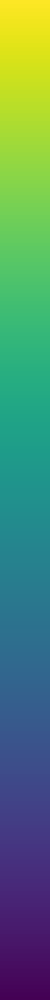</th>
<th><blockquote>
<p>1<br />
Cosine similarityInput patch row1</p>
</blockquote></th>
<th><blockquote>
<p>ViT-L16<br />
7 epochs, LR=0.0004, WD=0.1<br />
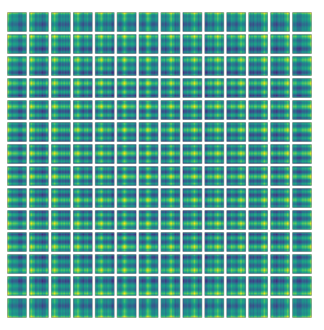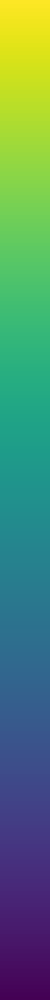1<br />
2<br />
3<br />
4<br />
5<br />
6<br />
7<br />
891011121314 1 2 3 4 5 6 7 8 9 10 11 12 13 14 Input patch column</p>
</blockquote></th>
<th><blockquote>
<p>1</p>
</blockquote></th>
<th>1</th>
<th>1</th>
<th>2</th>
<th><p>ViT-L16</p>
<blockquote>
<p>14 epochs, LR=0.0004, WD=0.1</p>
</blockquote></th>
<th><blockquote>
<p>1</p>
</blockquote></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td></td>
<td>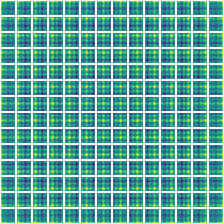</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>2</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>Cosine similarityInput patch row1</p>
</blockquote></td>
<td>2</td>
<td></td>
<td></td>
<td>3</td>
<td>4</td>
<td><blockquote>
<p>5 6 7 8 9 10 11 12 13 14Input patch column</p>
</blockquote></td>
<td><blockquote>
<p>Cosine similarity</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>3</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>3</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>4</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>4</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>5</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>5</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>6</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>6</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>7</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>7</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>8</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>8</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>9</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>9</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>10</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>10</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>11</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>11</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>12</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>12</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>1</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>13</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>13</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>14</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>14</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td>1</td>
<td>2</td>
<td>3</td>
<td>4</td>
<td><blockquote>
<p>5 6 7 8 9 10 11 12 13 14Input patch column</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

Figure 10: Position embeddings of models trained with different
hyperparameters.

> the stem of them model and before feeding the inputs to the
> Transformer encoder (default across all other experiments in this
> paper); (2) learn and add positional embeddings to the inputs at the
> beginning of each layer; (3) add a learned positional embeddings to
> the inputs at the beginning of each layer (shared between layers).
>
> Table 8 summarizes the results from this ablation study on a ViT-B/16
> model. As we can see, while there is a large gap between the
> performances of the model with no positional embedding and models with
> positional embedding, there is little to no difference between
> different ways of encoding positional information. We speculate that
> since our Transformer encoder operates on patch-level inputs, as
> opposed to pixel-level, the differences in how to encode spatial
> information is less important. More precisely, in patch-level inputs,
> the spatial dimensions are much smaller than the original pixel-level
> inputs, e.g., 14 *×* 14 as opposed to 224 *×* 224, and learning to
> represent the spatial relations in this resolution is equally easy for
> these different positional encoding strategies. Even so, the speciﬁc
> pattern of position embedding similarity learned by the network
> depends on the training hyperparameters (Figure 10).

<table>
<thead>
<tr class="header">
<th>Mean attention distance (pixels)</th>
<th>100</th>
<th><blockquote>
<p>0</p>
</blockquote></th>
<th>5</th>
<th>ViT-L/16</th>
<th><blockquote>
<p>Head 1 Head 2 Head 3 ...</p>
</blockquote></th>
<th>100</th>
<th><blockquote>
<p>0</p>
</blockquote></th>
<th>5</th>
<th><blockquote>
<p>R50x1 + ViT-L/16</p>
</blockquote></th>
<th><blockquote>
<p>Head 1<br />
Head 2<br />
Head 3<br />
...</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td>20</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>20</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>0</td>
<td></td>
<td></td>
<td><blockquote>
<p>10 15<br />
Network depth (layer)</p>
</blockquote></td>
<td><blockquote>
<p>20</p>
</blockquote></td>
<td>0</td>
<td></td>
<td></td>
<td><blockquote>
<p>10 15<br />
Network depth (layer)</p>
</blockquote></td>
<td><blockquote>
<p>20</p>
</blockquote></td>
</tr>
</tbody>
</table>

> Figure 11: Size of attended area by head and network depth. Attention
> distance was computed for 128 example images by averaging the distance
> between the query pixel and all other pixels, weighted by the
> attention weight. Each dot shows the mean attention distance across
> images for one of 16 heads at one layer. Image width is 224 pixels.
>
> D.5 EMPIRICAL COMPUTATIONAL COSTS
>
> We are also interested in real-world speed of the architectures on our
> hardware, which is not always well predicted by theoretical FLOPs due
> to details like lane widths and cache sizes. For this purpose,
>
> Published as a conference paper at ICLR 2021
>
> we perform timing of inference speed for the main models of interest,
> on a TPUv3 accelerator; the difference between inference and backprop
> speed is a constant model-independent factor.
>
> Figure 12 (left) shows how many images one core can handle per second,
> across various input sizes. Every single point refers to the peak
> performance measured across a wide range of batch-sizes. As can be
> seen, the theoretical bi-quadratic scaling of ViT with image size only
> barely starts happening for the largest models at the largest
> resolutions.
>
> Another quantity of interest is the largest batch-size each model can
> ﬁt onto a core, larger being better for scaling to large datasets.
> Figure 12 (right) shows this quantity for the same set of models. This
> shows that large ViT models have a clear advantage in terms of
> memory-efﬁciency over ResNet models.

<table>
<thead>
<tr class="header">
<th>Peak inference speed [img/sec/core]</th>
<th>104</th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td><p>103</p>
<blockquote>
<p>h-size</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>103</td>
<td></td>
<td>core batc</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td><blockquote>
<p>Largest per-</p>
</blockquote>
<p>102</p></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>102</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td><blockquote>
<p>64</p>
</blockquote></td>
<td><blockquote>
<p>128 224 Input size [px]</p>
</blockquote></td>
<td>384</td>
<td><blockquote>
<p>512</p>
</blockquote></td>
<td>64</td>
<td><blockquote>
<p>128 224 Input size [px]</p>
</blockquote></td>
<td>384</td>
<td><blockquote>
<p>512</p>
</blockquote></td>
</tr>
</tbody>
</table>

<table>
<tbody>
<tr class="odd">
<td><table>
<thead>
<tr class="header">
<th>R50x1</th>
<th>ViT-B/32</th>
<th>ViT-B/16</th>
<th>ViT-H/14</th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>R50x2</td>
<td>ViT-L/32</td>
<td>ViT-L/16</td>
<td>R152x4</td>
</tr>
</tbody>
</table></td>
</tr>
</tbody>
</table>

|     |     |     |     |     |     |
|-----|-----|-----|-----|-----|-----|
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |

|     |     |     |     |     |     |
|-----|-----|-----|-----|-----|-----|
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |
|     |     |     |     |     |     |

> Figure 12: **Left:** Real wall-clock timings of various architectures
> across input sizes. ViT models have speed comparable to similar
> ResNets. **Right**: Largest per-core batch-size ﬁtting on device with
> various architectures across input sizes. ViT models are clearly more
> memory-efﬁcient.

<table>
<tbody>
<tr class="odd">
<td>D.6</td>
<td><blockquote>
<p>AXIAL ATTENTION</p>
</blockquote></td>
</tr>
</tbody>
</table>

> Axial Attention (Huang et al., 2020; Ho et al., 2019) is a simple, yet
> effective technique to run selfattention on large inputs that are
> organized as multidimensional tensors. The general idea of axial
> attention is to perform multiple attention operations, each along a
> single axis of the input tensor, instead of applying 1-dimensional
> attention to the ﬂattened version of the input. In axial attention,
> each attention mixes information along a particular axis, while
> keeping information along the other axes independent. Along this line,
> Wang et al. (2020b) proposed the AxialResNet model in which all the
> convolutions with kernel size 3 *×* 3 in a ResNet50 are replaced by
> axial self-attention, i.e. a row and column attention, augmented by
> relative positional encoding. We have implemented AxialResNet as a
> baseline model.3.
>
> Moreover, we have modiﬁed ViT to process inputs in the 2-dimensional
> shape, instead of a 1dimensional sequence of patches, and incorporate
> Axial Transformer blocks, in which instead of a self-attention
> followed by an MLP, we have a a row-self-attention plus an MLP
> followed by a column-self-attention plus an MLP.
>
> Figure 13, present the performance of Axial ResNet, Axial-ViT-B/32 and
> Axial-ViT-B/16 on ImageNet 5shot linear, when pretrained on JFT
> dataset, verses the pretraining compute, both in terms of number of
> FLOPs and inference time (example per seconds). As we can see, both
> Axial-ViT-B/32 and Axial-ViT-B/16 do better than their ViT-B
> counterpart in terms of performance, but it comes at
>
> 3Our implementation is based on the open-sourced PyTorch
> implementation in . In our experiments, we reproduced the scorver, our
> implementation, similar to the open-source implementation, is very
> slow on TPUs. Therefore, we were not able to use it for extensive
> large-scale experiments. These may be unlocked by a carefully
> optimized implementation.

19

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>ImageNet 5-shot linear top-1 accuracy</th>
<th>0.650</th>
<th></th>
<th>ImageNet 5-shot linear top-1 accuracy</th>
<th>0.650</th>
<th></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td>0.625</td>
<td></td>
<td></td>
<td>0.625</td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>0.600</td>
<td></td>
<td></td>
<td>0.600</td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>0.575</td>
<td></td>
<td></td>
<td>0.575</td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>0.550</td>
<td></td>
<td></td>
<td>0.550</td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>0.525</td>
<td></td>
<td></td>
<td>0.525</td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td>0.500</td>
<td></td>
<td></td>
<td>0.500</td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td><blockquote>
<p>102<br />
Total compute [exaFLOPs]</p>
</blockquote></td>
<td></td>
<td></td>
<td><blockquote>
<p>103<br />
Peak inference speed [img/sec/core]</p>
</blockquote></td>
<td><blockquote>
<p>102</p>
</blockquote></td>
</tr>
</tbody>
</table>

<table>
<thead>
<tr class="header">
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th>Axia</th>
<th>lViT-B/16</th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>ViT-B/1</td>
<td>6</td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>AxialViT-B/32</td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td><p>ViT-</p>
<p>Axia</p></td>
<td><p>B/3</p>
<p>lRes</p></td>
<td>Net</td>
<td>50</td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td>R</td>
<td>sNet</td>
<td>50</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

<table>
<thead>
<tr class="header">
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th></th>
<th>AxialViT-B</th>
<th>/1</th>
<th>6</th>
<th></th>
<th></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>Vi</td>
<td>-B</td>
<td>/16</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td>Axi</td>
<td>alV</td>
<td>iT-B</td>
<td>/32</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td><blockquote>
<p>ViT-B</p>
</blockquote></td>
<td><blockquote>
<p>/32</p>
</blockquote></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td><blockquote>
<p>AxialRes</p>
</blockquote></td>
<td>Ne</td>
<td>t5</td>
<td>0</td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="even">
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
<tr class="odd">
<td></td>
<td></td>
<td>ResNet50</td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
<td></td>
</tr>
</tbody>
</table>

> Figure 13: Performance of Axial-Attention based models, in terms of
> top-1 accuracy on ImageNet 5-shot linear, versus their speed in terms
> of number of FLOPs (**left**) and inference time (**left**).
>
> the cost of more compute. This is because in Axial-ViT models, each
> Transformer block with global self-attention is replaced by two Axial
> Transformer blocks, one with row and one with column selfattention and
> although the sequence length that self-attention operates on is
> smaller in axial case, there is a extra MLP per Axial-ViT block. For
> the AxialResNet, although it looks reasonable in terms of
> accuracy/compute trade-off (Figure 13, left), the naive implementation
> is extremely slow on TPUs (Figure 13, right).

<table>
<tbody>
<tr class="odd">
<td>D.7</td>
<td><blockquote>
<p>ATTENTION DISTANCE</p>
</blockquote></td>
</tr>
</tbody>
</table>

> To understand how ViT uses self-attention to integrate information
> across the image, we analyzed the average distance spanned by
> attention weights at different layers (Figure 11). This “attention
> distance” is analogous to receptive ﬁeld size in CNNs. Average
> attention distance is highly variable across heads in lower layers,
> with some heads attending to much of the image, while others attend to
> small regions at or near the query location. As depth increases,
> attention distance increases for all heads. In the second half of the
> network, most heads attend widely across tokens.

<table>
<tbody>
<tr class="odd">
<td>D.8</td>
<td><blockquote>
<p>ATTENTION MAPS</p>
</blockquote></td>
</tr>
</tbody>
</table>

> To compute maps of the attention from the output token to the input
> space (Figures 6 and 14), we used Attention Rollout (Abnar & Zuidema,
> 2020). Brieﬂy, we averaged attention weights of ViT-L/16 across all
> heads and then recursively multiplied the weight matrices of all
> layers. This accounts for the mixing of attention across tokens
> through all layers.

<table>
<tbody>
<tr class="odd">
<td>D.9</td>
<td><blockquote>
<p>OBJECTNET RESULTS</p>
</blockquote></td>
</tr>
</tbody>
</table>

> We also evaluate our ﬂagship ViT-H/14 model on the ObjectNet benchmark
> following the evaluation setup in Kolesnikov et al. (2020), resulting
> in 82.1% top-5 accuracy and 61.7% top-1 accuracy.

<table>
<tbody>
<tr class="odd">
<td>D.10</td>
<td><blockquote>
<p>VTAB BREAKDOWN</p>
</blockquote></td>
</tr>
</tbody>
</table>

> Table 9 shows the scores attained on each of the VTAB-1k tasks.

20

> Published as a conference paper at ICLR 2021

<table>
<thead>
<tr class="header">
<th>1</th>
<th>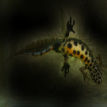</th>
<th>2</th>
<th>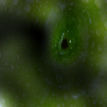</th>
<th>3</th>
<th>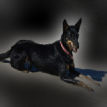</th>
<th>4</th>
<th>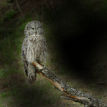</th>
<th>5</th>
<th>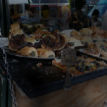</th>
<th>6</th>
<th>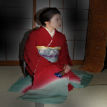</th>
<th>7</th>
<th>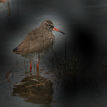</th>
<th>8</th>
<th><blockquote>
<p>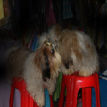</p>
</blockquote></th>
</tr>
</thead>
<tbody>
<tr class="odd">
<td>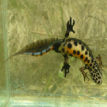</td>
<td></td>
<td>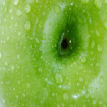</td>
<td></td>
<td>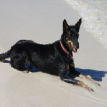</td>
<td></td>
<td>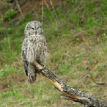</td>
<td></td>
<td>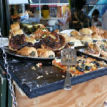</td>
<td></td>
<td>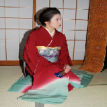</td>
<td></td>
<td>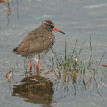</td>
<td></td>
<td>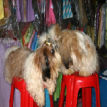</td>
<td></td>
</tr>
<tr class="even">
<td>9</td>
<td>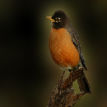</td>
<td>10</td>
<td>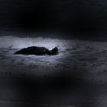</td>
<td>11</td>
<td>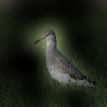</td>
<td>12</td>
<td>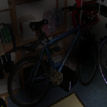</td>
<td>13</td>
<td>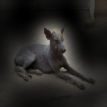</td>
<td>14</td>
<td>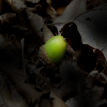</td>
<td>15</td>
<td>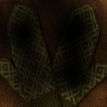</td>
<td>16</td>
<td><blockquote>
<p>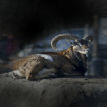</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>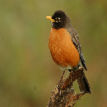</td>
<td></td>
<td>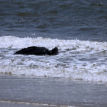</td>
<td></td>
<td>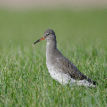</td>
<td></td>
<td>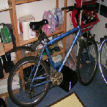</td>
<td></td>
<td>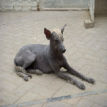</td>
<td></td>
<td>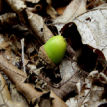</td>
<td></td>
<td>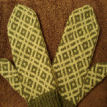</td>
<td></td>
<td>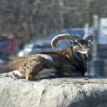</td>
<td></td>
</tr>
<tr class="even">
<td>17</td>
<td>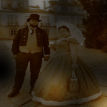</td>
<td>18</td>
<td>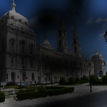</td>
<td>19</td>
<td>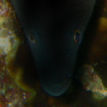</td>
<td>20</td>
<td>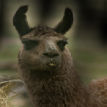</td>
<td>21</td>
<td>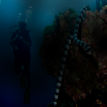</td>
<td>22</td>
<td>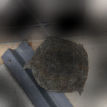</td>
<td>23</td>
<td>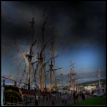</td>
<td>24</td>
<td><blockquote>
<p>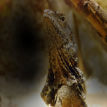</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>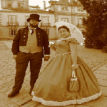</td>
<td></td>
<td>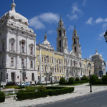</td>
<td></td>
<td>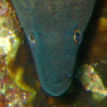</td>
<td></td>
<td>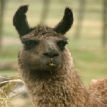</td>
<td></td>
<td>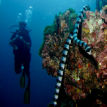</td>
<td></td>
<td>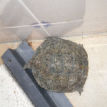</td>
<td></td>
<td>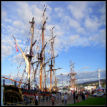</td>
<td></td>
<td>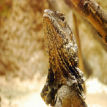</td>
<td></td>
</tr>
<tr class="even">
<td>25</td>
<td>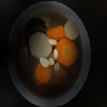</td>
<td>26</td>
<td>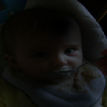</td>
<td>27</td>
<td>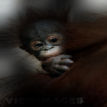</td>
<td>28</td>
<td>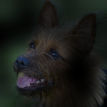</td>
<td>29</td>
<td>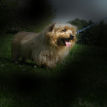</td>
<td>30</td>
<td>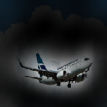</td>
<td>31</td>
<td>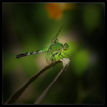</td>
<td>32</td>
<td><blockquote>
<p>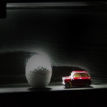</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>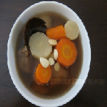</td>
<td></td>
<td>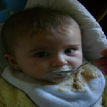</td>
<td></td>
<td>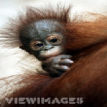</td>
<td></td>
<td>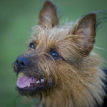</td>
<td></td>
<td>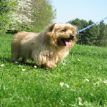</td>
<td></td>
<td>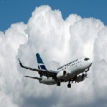</td>
<td></td>
<td>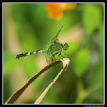</td>
<td></td>
<td>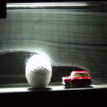</td>
<td></td>
</tr>
<tr class="even">
<td>33</td>
<td>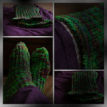</td>
<td>34</td>
<td>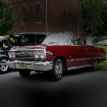</td>
<td>35</td>
<td>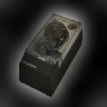</td>
<td>36</td>
<td>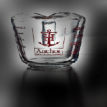</td>
<td>37</td>
<td>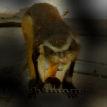</td>
<td>38</td>
<td>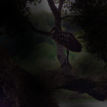</td>
<td>39</td>
<td>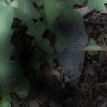</td>
<td>40</td>
<td><blockquote>
<p>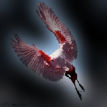</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>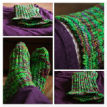</td>
<td></td>
<td>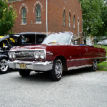</td>
<td></td>
<td>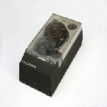</td>
<td></td>
<td>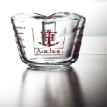</td>
<td></td>
<td>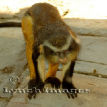</td>
<td></td>
<td>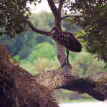</td>
<td></td>
<td>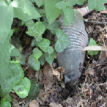</td>
<td></td>
<td>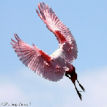</td>
<td></td>
</tr>
<tr class="even">
<td>41</td>
<td>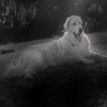</td>
<td>42</td>
<td>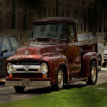</td>
<td>43</td>
<td>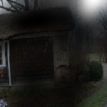</td>
<td>44</td>
<td>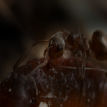</td>
<td>45</td>
<td>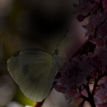</td>
<td>46</td>
<td>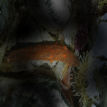</td>
<td>47</td>
<td>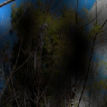</td>
<td>48</td>
<td><blockquote>
<p>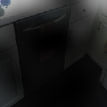</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>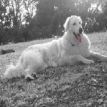</td>
<td></td>
<td>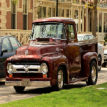</td>
<td></td>
<td>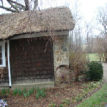</td>
<td></td>
<td>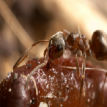</td>
<td></td>
<td>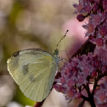</td>
<td></td>
<td>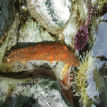</td>
<td></td>
<td>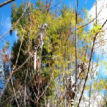</td>
<td></td>
<td>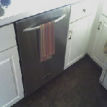</td>
<td></td>
</tr>
<tr class="even">
<td>49</td>
<td>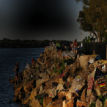</td>
<td>50</td>
<td>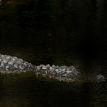</td>
<td>51</td>
<td>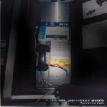</td>
<td>52</td>
<td>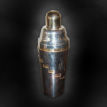</td>
<td>53</td>
<td>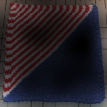</td>
<td>54</td>
<td>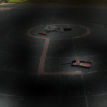</td>
<td>55</td>
<td>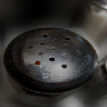</td>
<td>56</td>
<td><blockquote>
<p>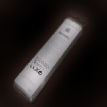</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>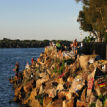</td>
<td></td>
<td>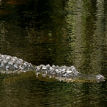</td>
<td></td>
<td>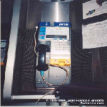</td>
<td></td>
<td>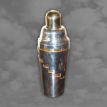</td>
<td></td>
<td>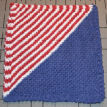</td>
<td></td>
<td>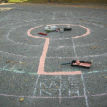</td>
<td></td>
<td>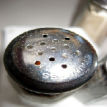</td>
<td></td>
<td>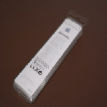</td>
<td></td>
</tr>
<tr class="even">
<td>57</td>
<td>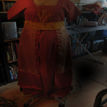</td>
<td>58</td>
<td>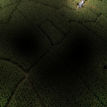</td>
<td>59</td>
<td>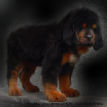</td>
<td>60</td>
<td>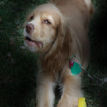</td>
<td>61</td>
<td>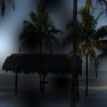</td>
<td>62</td>
<td>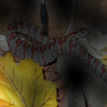</td>
<td>63</td>
<td>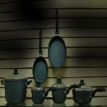</td>
<td>64</td>
<td><blockquote>
<p>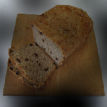</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>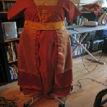</td>
<td></td>
<td>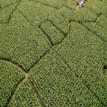</td>
<td></td>
<td>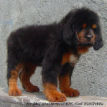</td>
<td></td>
<td>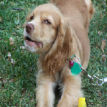</td>
<td></td>
<td>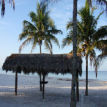</td>
<td></td>
<td>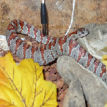</td>
<td></td>
<td>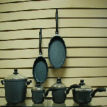</td>
<td></td>
<td>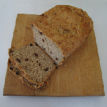</td>
<td></td>
</tr>
<tr class="even">
<td>65</td>
<td>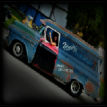</td>
<td>66</td>
<td>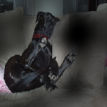</td>
<td>67</td>
<td>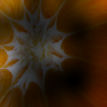</td>
<td>68</td>
<td>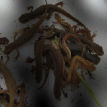</td>
<td>69</td>
<td>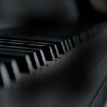</td>
<td>70</td>
<td>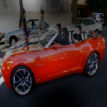</td>
<td>71</td>
<td>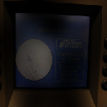</td>
<td>72</td>
<td><blockquote>
<p>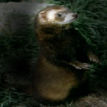</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>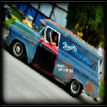</td>
<td></td>
<td>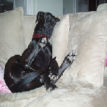</td>
<td></td>
<td>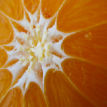</td>
<td></td>
<td>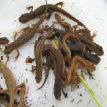</td>
<td></td>
<td>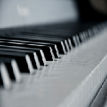</td>
<td></td>
<td>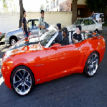</td>
<td></td>
<td>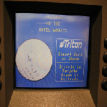</td>
<td></td>
<td>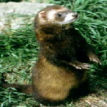</td>
<td></td>
</tr>
<tr class="even">
<td>73</td>
<td>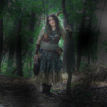</td>
<td>74</td>
<td>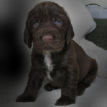</td>
<td>75</td>
<td>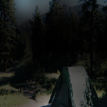</td>
<td>76</td>
<td>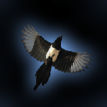</td>
<td>77</td>
<td>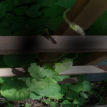</td>
<td>78</td>
<td>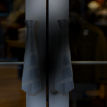</td>
<td>79</td>
<td>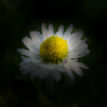</td>
<td>80</td>
<td><blockquote>
<p>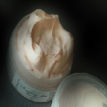</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>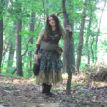</td>
<td></td>
<td>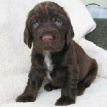</td>
<td></td>
<td>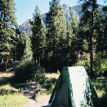</td>
<td></td>
<td>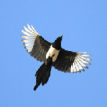</td>
<td></td>
<td>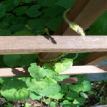</td>
<td></td>
<td>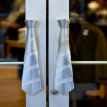</td>
<td></td>
<td>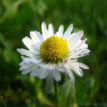</td>
<td></td>
<td>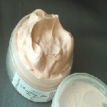</td>
<td></td>
</tr>
<tr class="even">
<td>81</td>
<td>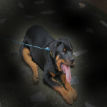</td>
<td>82</td>
<td>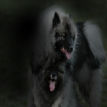</td>
<td>83</td>
<td>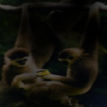</td>
<td>84</td>
<td>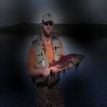</td>
<td>85</td>
<td>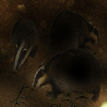</td>
<td>86</td>
<td>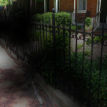</td>
<td>87</td>
<td>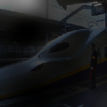</td>
<td>88</td>
<td><blockquote>
<p>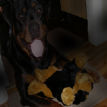</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>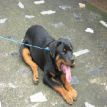</td>
<td></td>
<td>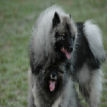</td>
<td></td>
<td>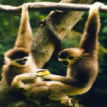</td>
<td></td>
<td>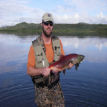</td>
<td></td>
<td>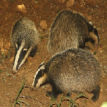</td>
<td></td>
<td>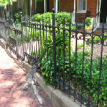</td>
<td></td>
<td>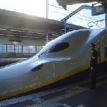</td>
<td></td>
<td>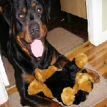</td>
<td></td>
</tr>
<tr class="even">
<td>89</td>
<td>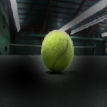</td>
<td>90</td>
<td>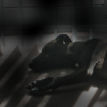</td>
<td>91</td>
<td>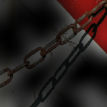</td>
<td>92</td>
<td>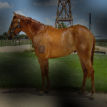</td>
<td>93</td>
<td>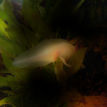</td>
<td>94</td>
<td>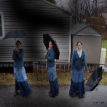</td>
<td>95</td>
<td>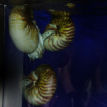</td>
<td>96</td>
<td><blockquote>
<p>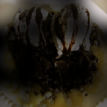</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>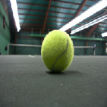</td>
<td></td>
<td>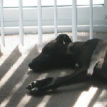</td>
<td></td>
<td>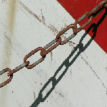</td>
<td></td>
<td>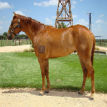</td>
<td></td>
<td>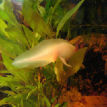</td>
<td></td>
<td>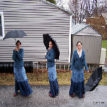</td>
<td></td>
<td>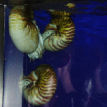</td>
<td></td>
<td>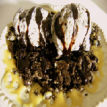</td>
<td></td>
</tr>
<tr class="even">
<td>97</td>
<td>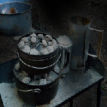</td>
<td>98</td>
<td>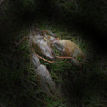</td>
<td>99</td>
<td>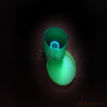</td>
<td>100</td>
<td>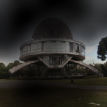</td>
<td>101</td>
<td>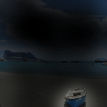</td>
<td>102</td>
<td>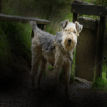</td>
<td>103</td>
<td>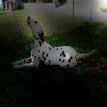</td>
<td>104</td>
<td><blockquote>
<p>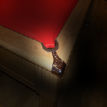</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>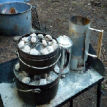</td>
<td></td>
<td>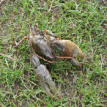</td>
<td></td>
<td>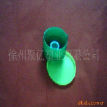</td>
<td></td>
<td>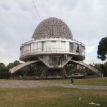</td>
<td></td>
<td>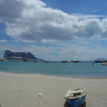</td>
<td></td>
<td>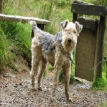</td>
<td></td>
<td>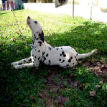</td>
<td></td>
<td>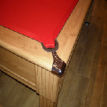</td>
<td></td>
</tr>
<tr class="even">
<td>105</td>
<td>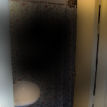</td>
<td>106</td>
<td>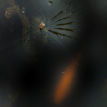</td>
<td>107</td>
<td>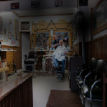</td>
<td>108</td>
<td>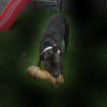</td>
<td>109</td>
<td>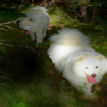</td>
<td>110</td>
<td>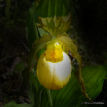</td>
<td>111</td>
<td>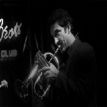</td>
<td>112</td>
<td><blockquote>
<p>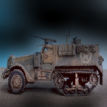</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>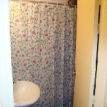</td>
<td></td>
<td>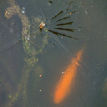</td>
<td></td>
<td>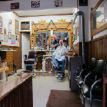</td>
<td></td>
<td>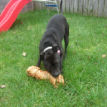</td>
<td></td>
<td>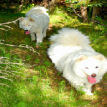</td>
<td></td>
<td>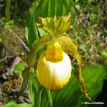</td>
<td></td>
<td>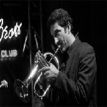</td>
<td></td>
<td>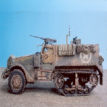</td>
<td></td>
</tr>
<tr class="even">
<td>113</td>
<td>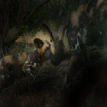</td>
<td>114</td>
<td>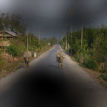</td>
<td>115</td>
<td>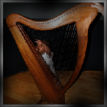</td>
<td>116</td>
<td>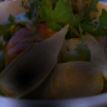</td>
<td>117</td>
<td>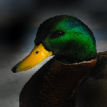</td>
<td>118</td>
<td>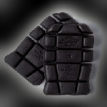</td>
<td>119</td>
<td>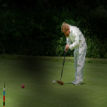</td>
<td>120</td>
<td><blockquote>
<p>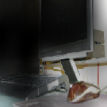</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>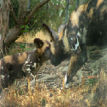</td>
<td></td>
<td>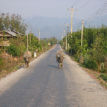</td>
<td></td>
<td>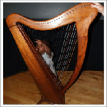</td>
<td></td>
<td>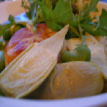</td>
<td></td>
<td>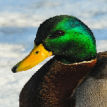</td>
<td></td>
<td>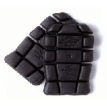</td>
<td></td>
<td>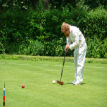</td>
<td></td>
<td>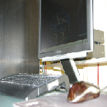</td>
<td></td>
</tr>
<tr class="even">
<td>121</td>
<td>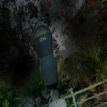</td>
<td>122</td>
<td>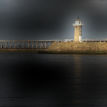</td>
<td>123</td>
<td>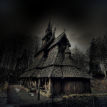</td>
<td>124</td>
<td>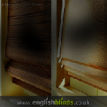</td>
<td>125</td>
<td>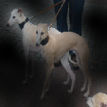</td>
<td>126</td>
<td>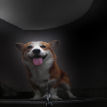</td>
<td>127</td>
<td>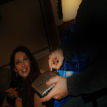</td>
<td>128</td>
<td><blockquote>
<p>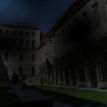</p>
</blockquote></td>
</tr>
<tr class="odd">
<td>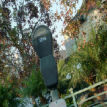</td>
<td></td>
<td>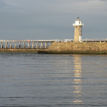</td>
<td></td>
<td>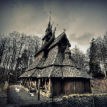</td>
<td></td>
<td>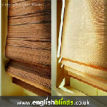</td>
<td></td>
<td>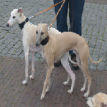</td>
<td></td>
<td>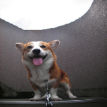</td>
<td></td>
<td>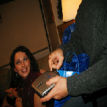</td>
<td></td>
<td>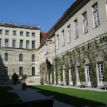</td>
<td></td>
</tr>
</tbody>
</table>

Figure 14: Further example attention maps as in Figure 6 (random
selection).

21

> Published as a conference paper at ICLR 2021

<table>
<tbody>
<tr class="odd">
<td><p>Table 9: Breakdown of VTAB-1k performanc</p>
<blockquote>
<p>Clevr-Count Retinopathy CIFAR-100<br />
Flowers102<br />
Caltech101<br />
Camelyon<br />
EuroSAT<br />
Resisc45<br />
Sun397<br />
SVHN<br />
DTD<br />
Pets<br />
</p>
</blockquote></td>
<td><p>e ac</p>
<blockquote>
<p>Clevr-Dist</p>
</blockquote></td>
<td><p>ross tasks.</p>
<blockquote>
<p>sNORB-Azim<br />
sNORB-Elev<br />
KITTI-Dist<br />
dSpr-Loc<br />
dSpr-Ori<br />
DMLab<br />
Mean</p>
</blockquote></td>
</tr>
</tbody>
</table>

> ViT-H/14 (JFT) 95.3 85.5 75.2 99.7 97.2 65.0 88.9 83.3 96.7 91.4 76.6
> 91.7 63.8 53.1 79.4 63.3 84.5 33.2 51.2 77.6 ViT-L/16 (JFT) 95.4 81.9
> 74.3 99.7 96.7 63.5 87.4 83.6 96.5 89.7 77.1 86.4 63.1 49.7 74.5 60.5
> 82.2 36.2 51.1 76.3 ViT-L/16 (I21k) 90.8 84.1 74.1 99.3 92.7 61.0 80.9
> 82.5 95.6 85.2 75.3 70.3 56.1 41.9 74.7 64.9 79.9 30.5 41.7 72.7

22